In [1]:
import os
%pwd

'd:\\ML-Projects\\03-Air-Quality-Index-Predictor\\research'

In [2]:
os.chdir("../")
%pwd

'd:\\ML-Projects\\03-Air-Quality-Index-Predictor'

<a id="1"></a>  
# <p style="padding:10px;background-color:#2e5551;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">1. Import Libraries</p>

In [3]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline
sns.set_style("darkgrid")

# import plotly.express as px
# import plotly.graph_objects as go




<a id="1"></a>  
# <p style="padding:10px;background-color:#2e5551;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">2. Reading and Understanding the Dataset</p>

<a id="1"></a>  
#### <p style="padding:5px;background-color:#d5eae9;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 50px 50px;overflow:hidden;font-weight:200">2.1. Import Dataset</p>

In [4]:
df = pd.read_csv("artifacts/data_ingestion/pollutant_data.csv")
df.head()

,date,city,pm2_5,pm10,o3,no2,so2,co
0,2018-01-01,Bengaluru,95.0,56.0,23.200001,17.200001,1.7,9.4
1,2018-01-02,Bengaluru,95.0,57.0,13.000000,16.100000,2.1,9.6
2,2018-01-03,Bengaluru,82.0,52.0,22.000000,18.700001,1.4,11.4
3,2018-01-04,Bengaluru,90.0,57.0,26.900000,18.700001,1.7,10.0
4,2018-01-05,Bengaluru,87.0,60.0,25.200001,19.500000,2.5,10.5


<a id="1"></a>  
#### <p style="padding:5px;background-color:#d5eae9;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 50px 50px;overflow:hidden;font-weight:200">2.2. Discover Data</p>

In [5]:
# View dimensions of dataset   
rows, col = df.shape
print ("Dimensions of dataset: {}" . format (df.shape))
print ('Rows:', rows,'\nColumns:', col)

Dimensions of dataset: (22825, 8)
Rows: 22825 
Columns: 8


In [6]:
# Check of missing values
df.isna().sum()

date        0
city        0
pm2_5       0
pm10     1720
o3         63
no2         0
so2         0
co          0
dtype: int64

pm10 and o3 columns has some missing values
But i will not affect us as we have pm2.5 concentraion for all the data and 
the aqi caluation formula will take the maximum of the air pollutant index as aqi

In [7]:
# Number of uniqe elements in each columns
unique = df.nunique()
unique.to_frame().T

,date,city,pm2_5,pm10,o3,no2,so2,co
0,2341,10,15253,14593,14605,13271,11809,3643


In [8]:
# Information about the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22825 entries, 0 to 22824
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   date    22825 non-null  object 
 1   city    22825 non-null  object 
 2   pm2_5   22825 non-null  float64
 3   pm10    21105 non-null  float64
 4   o3      22762 non-null  float64
 5   no2     22825 non-null  float64
 6   so2     22825 non-null  float64
 7   co      22825 non-null  float64
dtypes: float64(6), object(2)
memory usage: 1.4+ MB


**The date column is an object so we have to convert it into date format**

In [9]:
# Check Statistics of Data
df.describe()

,pm2_5,pm10,o3,no2,so2,co
count,22825.000000,21105.000000,22762.000000,22825.000000,22825.000000,22825.000000
mean,95.663262,93.752372,41.961694,20.390385,14.016519,3.195818
std,76.930026,90.916694,31.025407,17.039029,16.061331,3.499860
min,0.000000,0.000000,-61.944000,0.000000,0.000000,0.000000
25%,42.481000,40.125000,15.937750,9.400000,4.700000,0.720000
50%,75.959999,68.664000,33.731500,15.467000,8.235000,1.407000
75%,129.286000,115.200000,64.047500,25.896000,17.906000,5.100000
max,734.026000,999.000000,181.650000,373.399994,157.435000,65.699997


<a id="1"></a>  
# <p style="padding:10px;background-color:#2e5551;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">3. Data Preprocessing</p>

## 1. Date Column

In [15]:
df['date'].sample(20) 

id
2424     12-10-2018
12092    27-06-2021
14798    04-04-2022
6059     28-10-2019
10669    01-02-2021
4708     15-06-2019
19923    15-09-2023
9461     02-10-2020
2488     20-10-2018
8951     12-08-2020
11445    21-04-2021
16281    04-09-2022
12108    29-06-2021
12964    25-09-2021
20711    06-12-2023
13533    23-11-2021
17164    04-12-2022
14923    16-04-2022
19416    25-07-2023
18983    10-06-2023
Name: date, dtype: object

<div style="background-color: black; padding:20px; font-size:20px; color: white">
It seems so that the date is arranged in day-month-year format

In [16]:
df['date'] = pd.to_datetime(df['date'],format = "%d-%m-%Y")
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 22425 entries, 1 to 22425
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   city    22425 non-null  object        
 1   date    22425 non-null  datetime64[ns]
 2   pm2_5   22413 non-null  float64       
 3   pm10    20630 non-null  float64       
 4   o3      22340 non-null  float64       
 5   no2     22422 non-null  float64       
 6   so2     22420 non-null  float64       
 7   co      22411 non-null  float64       
dtypes: datetime64[ns](1), float64(6), object(1)
memory usage: 1.5+ MB


In [17]:
df['date'].sort_values(ascending = False)

id
22425   2024-05-30
22424   2024-05-30
22423   2024-05-30
22422   2024-05-30
22421   2024-05-30
           ...    
2       2018-01-01
6       2018-01-01
7       2018-01-01
8       2018-01-01
1       2018-01-01
Name: date, Length: 22425, dtype: datetime64[ns]

## 2. City column

In [15]:
print("Total number of cities are ",df['city'].nunique() )
df['city'].value_counts()

Total number of cities are  11


city
Hyderabad             2341
Chennai               2340
Delhi                 2340
Jaipur                2340
Lucknow               2340
Patna                 2339
Thiruvananthapuram    2336
Bhopal                2066
Chandigarh            2043
Bangalore             1246
Bengaluru             1097
Name: count, dtype: int64

## 3. O3 Column


In [20]:
df[df['o3']<0]

,city,pm2_5,pm10,o3,no2,so2,co
date,,,,,,,
2023-07-10,Bengaluru,2.298,3.256,-0.575,8.923,3.000,0.297
2023-07-11,Bengaluru,2.232,3.161,-1.347,8.658,2.906,0.292
2023-07-12,Bengaluru,2.126,3.019,-2.340,8.419,2.816,0.288
2023-07-13,Bengaluru,2.010,2.845,-3.253,8.026,2.706,0.281
2023-07-14,Bengaluru,1.960,2.769,-4.513,7.775,2.639,0.277
...,...,...,...,...,...,...,...
2023-07-22,Thiruvananthapuram,7.971,10.785,-16.676,7.332,4.966,0.291
2023-07-23,Thiruvananthapuram,8.003,10.590,-22.032,7.641,5.131,0.297
2023-07-24,Thiruvananthapuram,8.422,11.165,-28.838,7.853,5.303,0.301


In [21]:
df['o3'] = df['o3'].apply(lambda x: 1 if x < 1 else x)

## 4. Rename column

In [22]:
df.columns

Index(['city', 'pm2_5', 'pm10', 'o3', 'no2', 'so2', 'co'], dtype='object')

In [23]:
df.rename(columns = {'co':'CO','no2':'NO2','o3':'O3','pm10':'PM10','pm2_5':'PM2.5','so2':'SO2'}, inplace = True) 
df.columns

Index(['city', 'PM2.5', 'PM10', 'O3', 'NO2', 'SO2', 'CO'], dtype='object')

## 6. Calculating AQI

<div style="background-color: black; padding:20px; font-size:20px; color: white">

We will we now finding the AQI acording to the standard formula


In [24]:
new_df = df.copy()

In [25]:
## PM10 Sub-Index calculation
def get_PM10_subindex(x):
    if x <= 50:
        return x
    elif x <= 100:
        return x
    elif x <= 250:
        return 100 + (x - 100) * 100 / 150
    elif x <= 350:
        return 200 + (x - 250)
    elif x <= 430:
        return 300 + (x - 350) * 100 / 80
    elif x > 430:
        return 400 + (x - 430) * 100 / 80
    else:
        return 0

## PM2.5 Sub-Index calculation
def get_PM25_subindex(x):
    if x <= 30:
        return x * 50 / 30
    elif x <= 60:
        return 50 + (x - 30) * 50 / 30
    elif x <= 90:
        return 100 + (x - 60) * 100 / 30
    elif x <= 120:
        return 200 + (x - 90) * 100 / 30
    elif x <= 250:
        return 300 + (x - 120) * 100 / 130
    elif x > 250:
        return 400 + (x - 250) * 100 / 130
    else:
        return 0


## SO2 Sub-Index calculation
def get_SO2_subindex(x):
    if x <= 40:
        return x * 50 / 40
    elif x <= 80:
        return 50 + (x - 40) * 50 / 40
    elif x <= 380:
        return 100 + (x - 80) * 100 / 300
    elif x <= 800:
        return 200 + (x - 380) * 100 / 420
    elif x <= 1600:
        return 300 + (x - 800) * 100 / 800
    elif x > 1600:
        return 400 + (x - 1600) * 100 / 800
    else:
        return 0

## NOx Sub-Index calculation
def get_NOx_subindex(x):
    if x <= 40:
        return x * 50 / 40
    elif x <= 80:
        return 50 + (x - 40) * 50 / 40
    elif x <= 180:
        return 100 + (x - 80) * 100 / 100
    elif x <= 280:
        return 200 + (x - 180) * 100 / 100
    elif x <= 400:
        return 300 + (x - 280) * 100 / 120
    elif x > 400:
        return 400 + (x - 400) * 100 / 120
    else:
        return 0

### CO Sub-Index calculation
def get_CO_subindex(x):
    if x <= 1:
        return x * 50 / 1
    elif x <= 2:
        return 50 + (x - 1) * 50 / 1
    elif x <= 10:
        return 100 + (x - 2) * 100 / 8
    elif x <= 17:
        return 200 + (x - 10) * 100 / 7
    elif x <= 34:
        return 300 + (x - 17) * 100 / 17
    elif x > 34:
        return 400 + (x - 34) * 100 / 17
    else:
        return 0

## O3 Sub-Index calculation
def get_O3_subindex(x):
    if x <= 50:
        return x * 50 / 50
    elif x <= 100:
        return 50 + (x - 50) * 50 / 50
    elif x <= 168:
        return 100 + (x - 100) * 100 / 68
    elif x <= 208:
        return 200 + (x - 168) * 100 / 40
    elif x <= 748:
        return 300 + (x - 208) * 100 / 539
    elif x > 748:
        return 400 + (x - 400) * 100 / 539
    else:
        return 0

new_df["PM2.5_SubIndex"] = new_df["PM2.5"].apply(lambda x: get_PM25_subindex(x))

new_df["PM10_SubIndex"] = new_df["PM10"].apply(lambda x: get_PM10_subindex(x))

new_df["O3_SubIndex"] = new_df["O3"].apply(lambda x: get_O3_subindex(x))

new_df["CO_SubIndex"] = new_df["CO"].apply(lambda x: get_CO_subindex(x))

new_df["NO2_SubIndex"] = new_df["NO2"].apply(lambda x: get_NOx_subindex(x))

new_df["SO2_SubIndex"] = new_df["SO2"].apply(lambda x: get_SO2_subindex(x))


In [26]:
new_df.head()

,city,PM2.5,PM10,O3,NO2,SO2,CO,PM2.5_SubIndex,PM10_SubIndex,O3_SubIndex,CO_SubIndex,NO2_SubIndex,SO2_SubIndex
date,,,,,,,,,,,,,
2018-01-01,Bengaluru,95.0,56.0,23.200001,17.200001,1.7,9.4,216.666667,56.0,23.200001,192.500000,21.500001,2.125
2018-01-02,Bengaluru,95.0,57.0,13.000000,16.100000,2.1,9.6,216.666667,57.0,13.000000,195.000000,20.125000,2.625
2018-01-03,Bengaluru,82.0,52.0,22.000000,18.700001,1.4,11.4,173.333333,52.0,22.000000,220.000000,23.375001,1.750
2018-01-04,Bengaluru,90.0,57.0,26.900000,18.700001,1.7,10.0,200.000000,57.0,26.900000,200.000000,23.375001,2.125
2018-01-05,Bengaluru,87.0,60.0,25.200001,19.500000,2.5,10.5,190.000000,60.0,25.200001,207.142857,24.375000,3.125


In [27]:
## AQI bucketing
def get_AQI_bucket(x):
    if x <= 50:
        return "Good"
    elif x <= 100:
        return "Satisfactory"
    elif x <= 200:
        return "Moderate"
    elif x <= 300:
        return "Poor"
    elif x <= 400:
        return "Very Poor"
    elif x > 400:
        return "Severe"
    else:
        return np.NaN

# The Aqi value is going to the value of the highest air pollutant
new_df["AQI_calculated"] = round(new_df[["PM2.5_SubIndex", "PM10_SubIndex", "SO2_SubIndex", "NO2_SubIndex",
                                  "CO_SubIndex", "O3_SubIndex"]].max(axis = 1))

new_df["AQI_bucket_calculated"] = new_df["AQI_calculated"].apply(lambda x: get_AQI_bucket(x))
new_df[~new_df.AQI_calculated.isna()].head(13)


,city,PM2.5,PM10,O3,NO2,SO2,CO,PM2.5_SubIndex,PM10_SubIndex,O3_SubIndex,CO_SubIndex,NO2_SubIndex,SO2_SubIndex,AQI_calculated,AQI_bucket_calculated
date,,,,,,,,,,,,,,,
2018-01-01,Bengaluru,95.0,56.0,23.200001,17.200001,1.7,9.4,216.666667,56.0,23.200001,192.500000,21.500001,2.125,217.0,Poor
2018-01-02,Bengaluru,95.0,57.0,13.000000,16.100000,2.1,9.6,216.666667,57.0,13.000000,195.000000,20.125000,2.625,217.0,Poor
2018-01-03,Bengaluru,82.0,52.0,22.000000,18.700001,1.4,11.4,173.333333,52.0,22.000000,220.000000,23.375001,1.750,220.0,Poor
2018-01-04,Bengaluru,90.0,57.0,26.900000,18.700001,1.7,10.0,200.000000,57.0,26.900000,200.000000,23.375001,2.125,200.0,Moderate
2018-01-05,Bengaluru,87.0,60.0,25.200001,19.500000,2.5,10.5,190.000000,60.0,25.200001,207.142857,24.375000,3.125,207.0,Poor
2018-01-06,Bengaluru,93.0,61.0,32.900002,19.100000,2.1,9.8,210.000000,61.0,32.900002,197.500000,23.875000,2.625,210.0,Poor
2018-01-07,Bengaluru,114.0,63.0,35.799999,21.299999,2.1,10.3,280.000000,63.0,35.799999,204.285714,26.624999,2.625,280.0,Poor
2018-01-08,Bengaluru,102.0,58.0,40.799999,18.700001,2.1,9.6,240.000000,58.0,40.799999,195.000000,23.375001,2.625,240.0,Poor
2018-01-09,Bengaluru,100.0,55.0,29.299999,20.200001,3.3,10.2,233.333333,55.0,29.299999,202.857143,25.250001,4.125,233.0,Poor


<a id="1"></a>  
# <p style="padding:10px;background-color:#254441;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">5. Exploratory Data Analysis (EDA)</p>

## 5.1 Visualizing the missing values

In [28]:
# Missing values
def missing_values_table(df):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

missing_values= missing_values_table(new_df)
missing_values.style.background_gradient(cmap='Reds')

Your selected dataframe has 15 columns.
There are 2 columns that have missing values.


,Missing Values,% of Total Values
PM10,1720,7.500000
O3,63,0.300000


## 5.2 Visualizing the Major pollutants

In [39]:
pollutants = ['PM2.5','PM10','AQI_calculated']

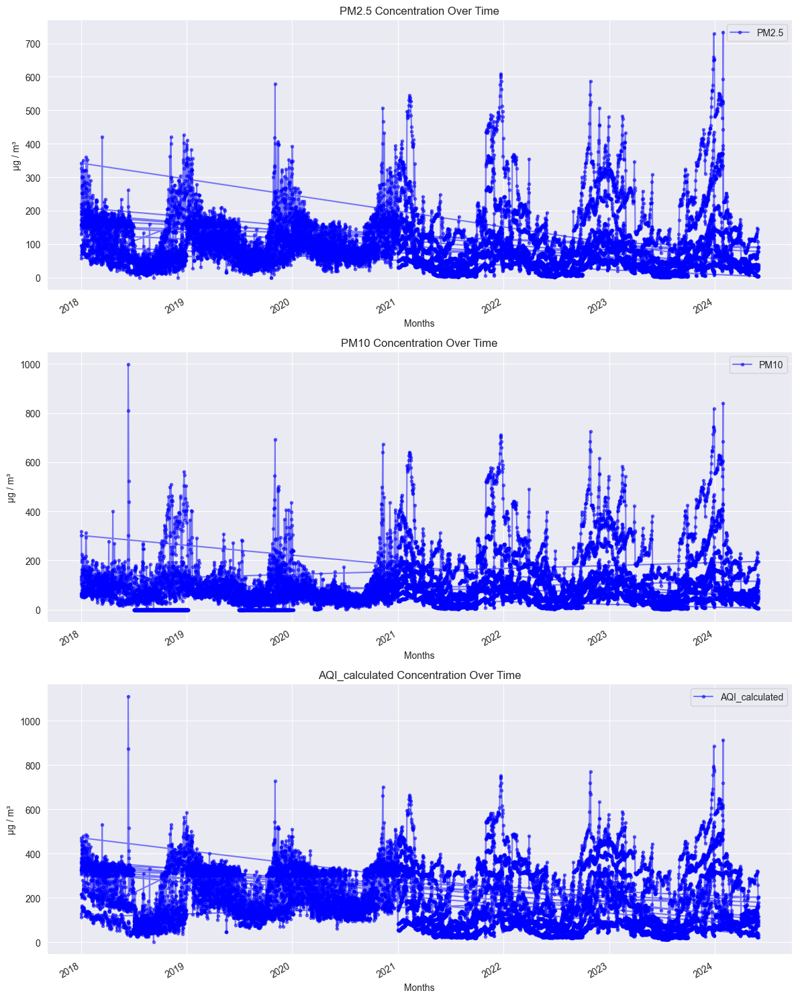

In [40]:
fig, axes = plt.subplots(nrows=len(pollutants), ncols=1, figsize=(12, 15))
copy_df = new_df.copy()
# Iterate over pollutants
for i, pollutant in enumerate(pollutants):
    ax = axes[i]
    copy_df[pollutant].plot(marker='.', alpha=0.5, linestyle='-', ax=ax, color='blue')
    ax.set_xlabel('Months')
    ax.set_ylabel('µg / m³')  # Update unit
    ax.set_title(f'{pollutant} Concentration Over Time')
    ax.grid(True)
    ax.legend([pollutant], loc='upper right')  # Custom legend

# Adjust layout
plt.tight_layout()
plt.show()

<div style="background-color: black; padding:20px; font-size:20px; color: white">The PM10, PM2.5 and AQI  show a seasonal effect , with pollution being higher in winter months as compared to the summer ones.

## 5.3 Visulaizing the trends in air pollutants 

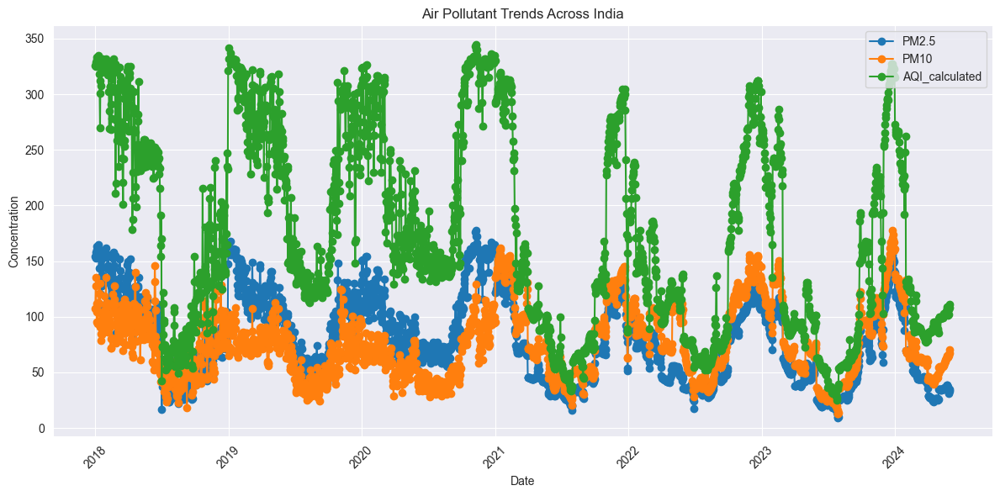

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure only numeric columns are included in aggregation
numeric_columns = new_df.select_dtypes(include='number')

# Drop missing values before aggregation
numeric_columns.dropna(inplace=True)

# Aggregate the data by date, taking the median across all cities
aggregated_df = numeric_columns.groupby(numeric_columns.index).median()

# Plot the trend for each pollutant
plt.figure(figsize=(12, 6))

# Plot PM2.5 trend
plt.plot(aggregated_df.index, aggregated_df['PM2.5'], label='PM2.5', marker='o')

# Plot PM10 trend
plt.plot(aggregated_df.index, aggregated_df['PM10'], label='PM10', marker='o')

# Plot AQI calculated trend
plt.plot(aggregated_df.index, aggregated_df['AQI_calculated'], label='AQI_calculated', marker='o')

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Concentration')
plt.title('Air Pollutant Trends Across India')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


## 5.4 Distribuiton of various gases and particulate in air

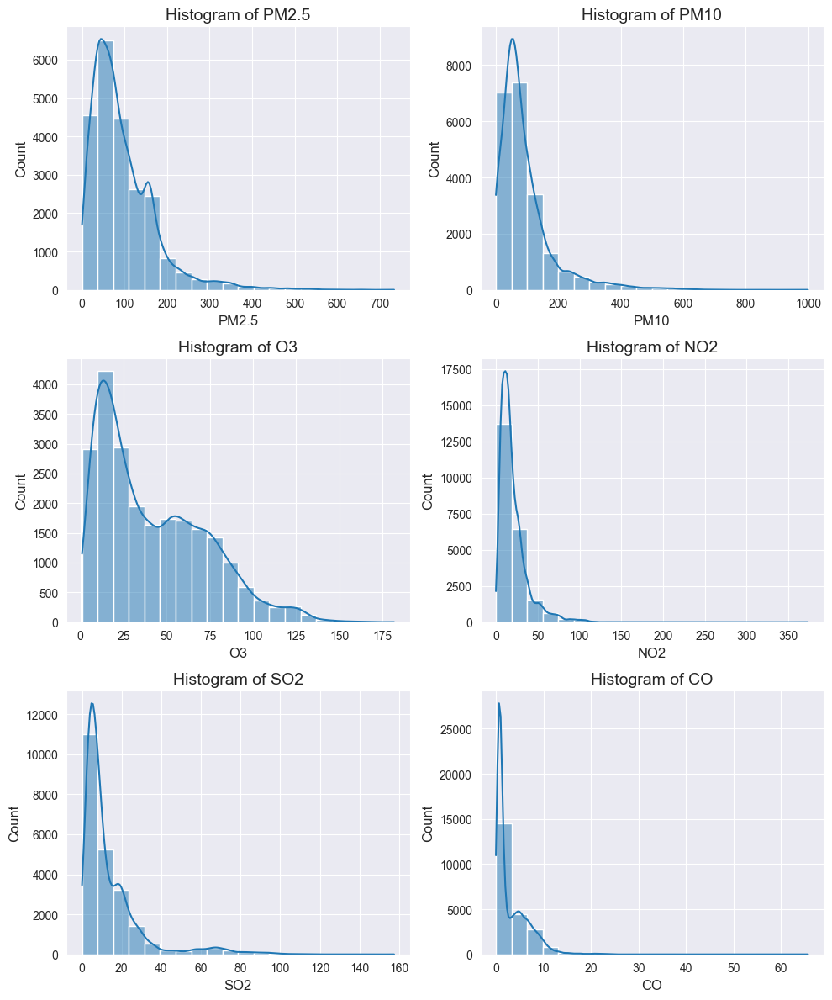

In [51]:
plt.figure(figsize=(10, 12))
copy_df = new_df.copy()
pollutants =  ['PM2.5', 'PM10', 'O3', 'NO2', 'SO2', 'CO']
for i, col in enumerate(pollutants, start=1):
    plt.subplot(3, 2, i)
    sns.histplot(copy_df[col].dropna(), bins=20, kde=True, edgecolor='white')
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.title(f'Histogram of {col}', fontsize=14)

plt.tight_layout()
plt.show()

## 5.4 Visulaizing the most polluted city within India in terms of air pollution

In [52]:

def max_polluted_city(pollutant):
    x1 = copy_df[[pollutant,'city']].groupby(["city"]).mean().sort_values(by=pollutant,ascending=False).reset_index()
    x1[pollutant] = round(x1[pollutant],2)
    return x1[:10].style.background_gradient(cmap='OrRd')

from IPython.display import display_html

def display_side_by_side(*args):
    html_str = ''.join([copy_df.to_html() + '&nbsp;&nbsp;&nbsp;' for copy_df in args])
    display_html(html_str.replace('table', 'table style="display:inline"'), raw=True)

pm2_5 = max_polluted_city('PM2.5')
pm10 = max_polluted_city('PM10')
no2 = max_polluted_city('NO2')
so2 = max_polluted_city('SO2')
co = max_polluted_city('CO')
o3 = max_polluted_city('O3')

display_side_by_side(pm2_5,pm10,no2,so2,co,o3)

,city,PM2.5
0,Delhi,194.250000
1,Patna,146.500000
2,Lucknow,138.010000
3,Chandigarh,88.880000
4,Jaipur,82.250000
5,Hyderabad,72.240000
6,Bhopal,70.180000
7,Chennai,65.370000
8,Bengaluru,48.610000
9,Thiruvananthapuram,46.460000


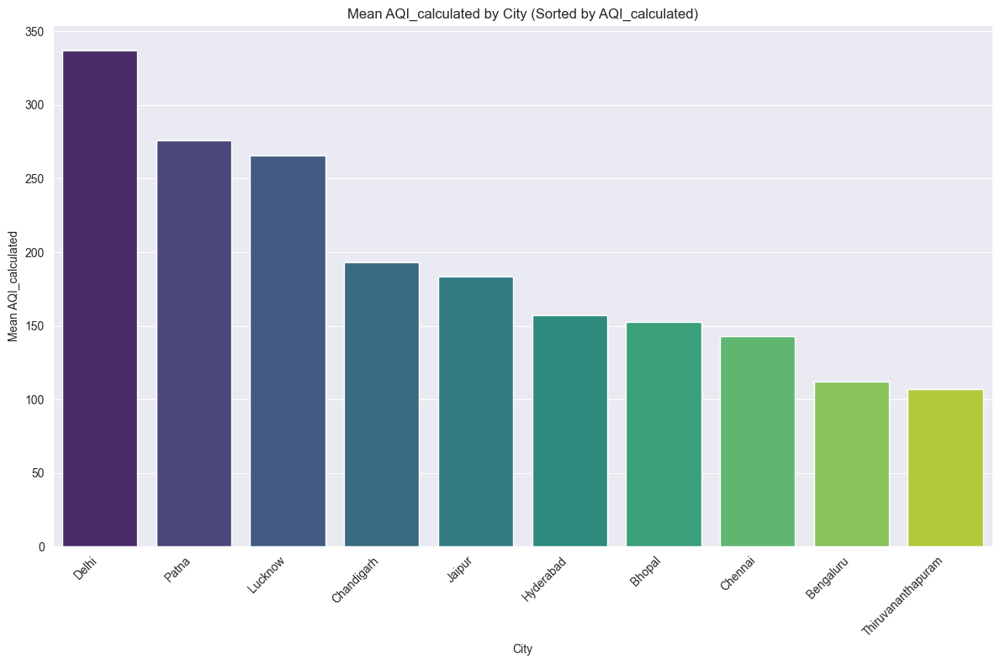

In [53]:
# Calculate the mean value of the pollutant for each city
x1 = copy_df[[pollutant, 'city']].groupby(["city"]).mean().reset_index()

# Sort the cities based on their AQI calculated in descending order
x1_sorted = x1.sort_values(by='AQI_calculated', ascending=False)

# Round the pollutant values to two decimal places
x1[pollutant] = round(x1[pollutant], 2)

# Create the bar plot
plt.figure(figsize=(12, 8))
sns.barplot(data=x1_sorted, x='city', y=pollutant, palette='viridis')
plt.xlabel('City')
plt.ylabel(f'Mean {pollutant}')
plt.title(f'Mean {pollutant} by City (Sorted by AQI_calculated)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


Here we can see clearly Delhi is the city with the highest average aqi value mean the air in delhi is full of pollutants while Triuvananthapuram is the city with the lowest average aqi value making its air fresh and clean of many pollutants

<a id="1"></a>  
# <p style="padding:10px;background-color:#254441;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">6. City wise Analysis </p>

## Class for ploting the city wise analysis plots

In [62]:
class AirQualityAnalyzer:
    def __init__(self, dataframe, city):
        self.dataframe = dataframe
        self.city = city
        self.dataframe.index = pd.to_datetime(self.dataframe.index)

    def _plot_heading(self, title):
        from IPython.display import display, HTML
        display(HTML(f'<h1 style="text-align:center; color:blue; font-size:44px;">{title}</h1>'))

    def _line_chart(self, pollutants):
        self._plot_heading("All Time Trend of the Data")
        plt.figure(figsize=(14, 7))
        for pollutant in pollutants:
            sns.lineplot(data=self.dataframe, x=self.dataframe.index, y=pollutant, label=pollutant)
        plt.title('All Time Trend of the Data')
        plt.xlabel('Date')
        plt.ylabel('Pollutant Concentration')
        plt.legend()
        plt.show()

    def _plot_pollutants_over_months(self, pollutants, years):
        self._plot_heading("Yearly Trend Plot of the Pollutants")
        self.dataframe['month'] = self.dataframe.index.strftime('%b')
        for pollutant in pollutants:
            plt.figure(figsize=(14, 7))
            for year in years:
                yearly_data = self.dataframe[self.dataframe.index.year == year]
                monthly_avg = yearly_data.groupby('month')[pollutant].mean().reindex(
                    ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
                )
                sns.lineplot(data=monthly_avg, label=year, marker='o')
            plt.title(f'{pollutant} Concentration Over Months per Year')
            plt.xlabel('Month')
            plt.ylabel(f'{pollutant} Concentration')
            plt.legend(title='Year')
            plt.show()

    def _seasonal_analysis(self, pollutants):
        self._plot_heading("Seasonal Analysis")
        self.dataframe['season'] = self.dataframe.index.month % 12 // 3 + 1
        season_names = {1: 'Winter', 2: 'Spring', 3: 'Summer', 4: 'Fall'}
        self.dataframe['season'] = self.dataframe['season'].map(season_names)
        for pollutant in pollutants:
            plt.figure(figsize=(14, 7))
            sns.boxplot(x='season', y=pollutant, data=self.dataframe, order=['Winter', 'Spring', 'Summer', 'Fall'])
            plt.title(f'Seasonal Analysis of {pollutant}')
            plt.xlabel('Season')
            plt.ylabel(f'{pollutant} Concentration')
            plt.show()

    def _monthly_trends(self, pollutants):
        self._plot_heading("Monthly Trends")
        self.dataframe['month'] = self.dataframe.index.strftime('%b')
        for pollutant in pollutants:
            plt.figure(figsize=(14, 7))
            sns.boxplot(x='month', y=pollutant, data=self.dataframe, order=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
            plt.title(f'Monthly Trend of {pollutant}')
            plt.xlabel('Month')
            plt.ylabel(f'{pollutant} Concentration')
            plt.show()

    def _kde_plot_pollutants_over_years(self, pollutants, years):
        self._plot_heading("KDE Plot of Pollutants Over Years")
        for pollutant in pollutants:
            plt.figure(figsize=(14, 7))
            for year in years:
                if year != 2024:  # Exclude 2024
                    yearly_data = self.dataframe[self.dataframe.index.year == year]
                    sns.kdeplot(yearly_data[pollutant], label=str(year), shade=True)
            plt.title(f'{pollutant} Concentration KDE Plot Over Years (excluding 2024)')
            plt.xlabel(f'{pollutant} Concentration')
            plt.ylabel('Density')
            plt.legend(title='Year')
            plt.show()

    def _pollution_events(self, threshold):
        self._plot_heading("Pollution Events")
        high_pollution = self.dataframe[self.dataframe['AQI_calculated'] > threshold]
        low_pollution = self.dataframe[self.dataframe['AQI_calculated'] < threshold]
        plt.figure(figsize=(14, 7))
        plt.plot(self.dataframe.index, self.dataframe['AQI_calculated'], marker='o', linestyle='None', alpha=0.5, label='All Data')
        plt.plot(high_pollution.index, high_pollution['AQI_calculated'], marker='o', linestyle='None', color='red', label='High Pollution Events')
        plt.plot(low_pollution.index, low_pollution['AQI_calculated'], marker='o', linestyle='None', color='green', label='Low Pollution Events')
        plt.axhline(y=threshold, color='blue', linestyle='--', label='Threshold')
        plt.title(f'Pollution Events Based on AQI Threshold {threshold}')
        plt.xlabel('Date')
        plt.ylabel('AQI Calculated')
        plt.legend()
        plt.show()

    def _correlation_analysis(self):
        self._plot_heading("Correlation Analysis")
        corr_matrix = self.dataframe[['NO2', 'PM10', 'PM2.5', 'O3', 'SO2', 'CO', 'AQI_calculated']].corr()
        plt.figure(figsize=(14, 7))
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
        plt.title('Correlation Matrix')
        plt.show()

    def analyze(self, pollutants, years, threshold):
        self._line_chart(pollutants)
        self._plot_pollutants_over_months(pollutants, years)
        self._seasonal_analysis(pollutants)
        self._monthly_trends(pollutants)
        self._kde_plot_pollutants_over_years(pollutants, years)
        self._pollution_events(threshold)
        self._correlation_analysis()

## 6.1 Delhi

In [59]:
df_Delhi = new_df[new_df['city']=='Delhi']

In [60]:
df_Delhi[['NO2', 'PM10', 'PM2.5', 'O3', 'SO2', 'CO','AQI_calculated']].describe()

,NO2,PM10,PM2.5,O3,SO2,CO,AQI_calculated
count,2340.000000,2340.000000,2340.000000,2340.000000,2340.000000,2340.000000,2340.000000
mean,46.723628,226.985303,194.246273,39.011854,40.245365,4.981703,337.176496
std,28.375919,147.487642,117.186839,31.616653,32.403375,3.926238,123.299741
min,5.100000,17.755000,20.120000,1.000000,2.800000,0.100000,37.000000
25%,20.900000,119.455500,113.103750,13.645000,7.200000,2.079000,277.000000
50%,47.109000,178.000000,162.000000,30.615001,47.187000,3.871500,332.000000
75%,66.092000,302.207500,242.103250,52.900252,67.984000,6.705750,395.000000
max,174.526000,999.000000,734.026000,166.735000,157.435000,30.600000,1111.000000


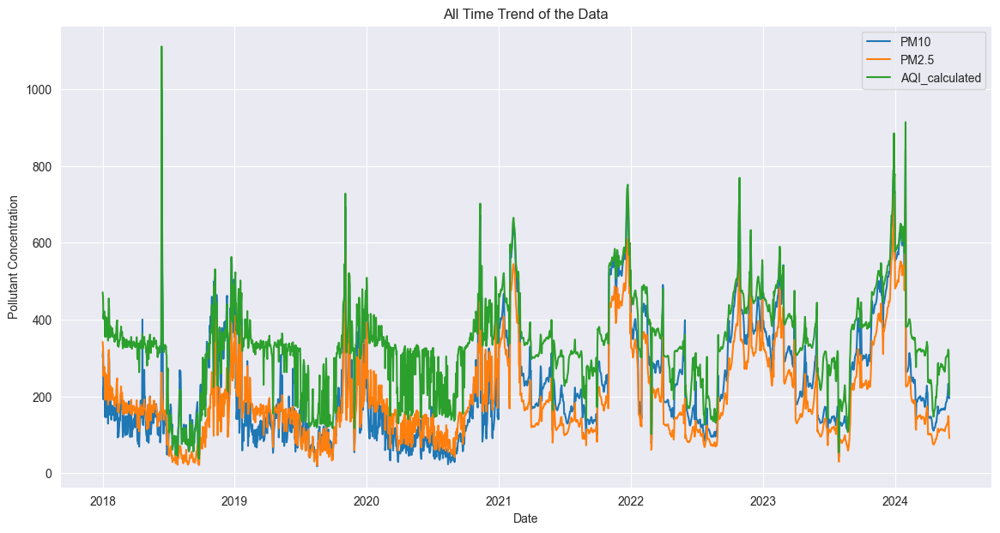

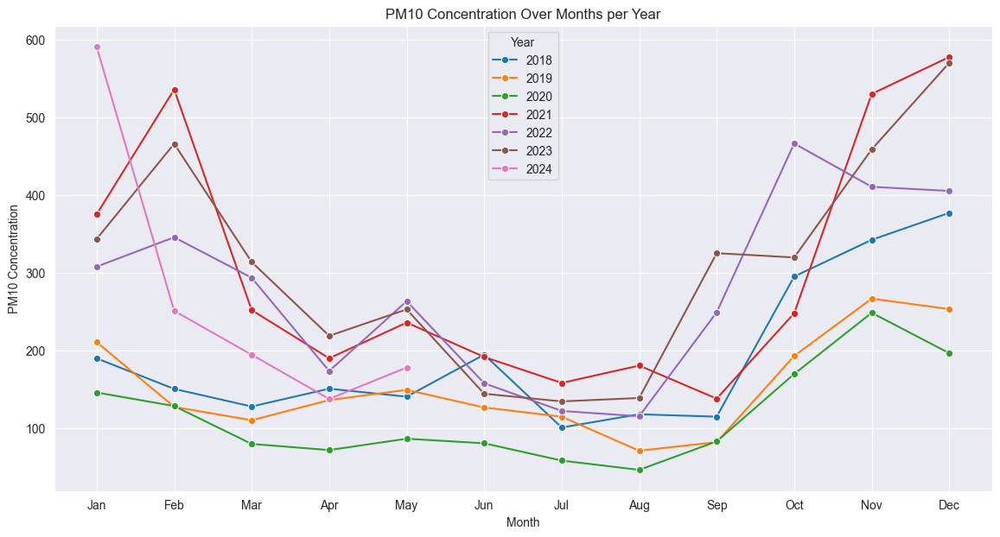

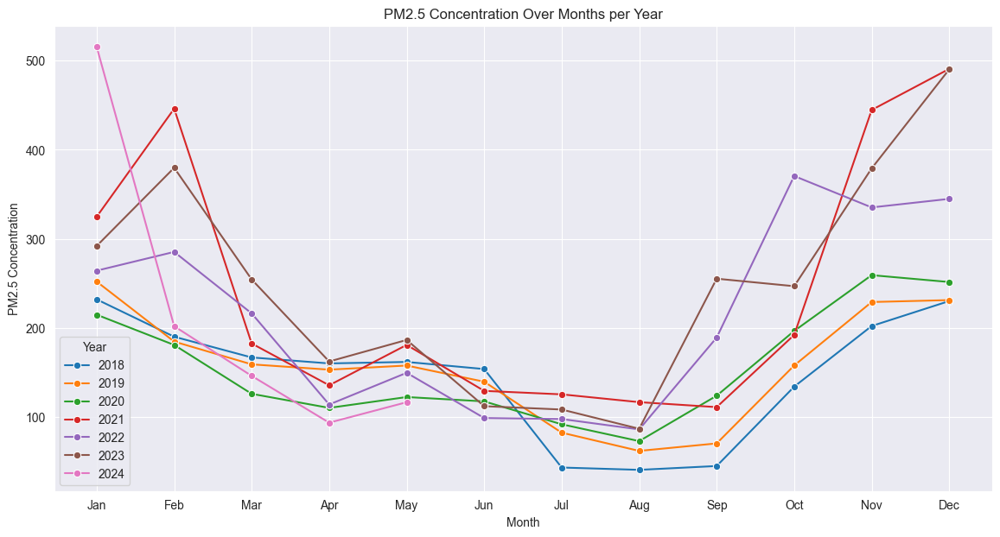

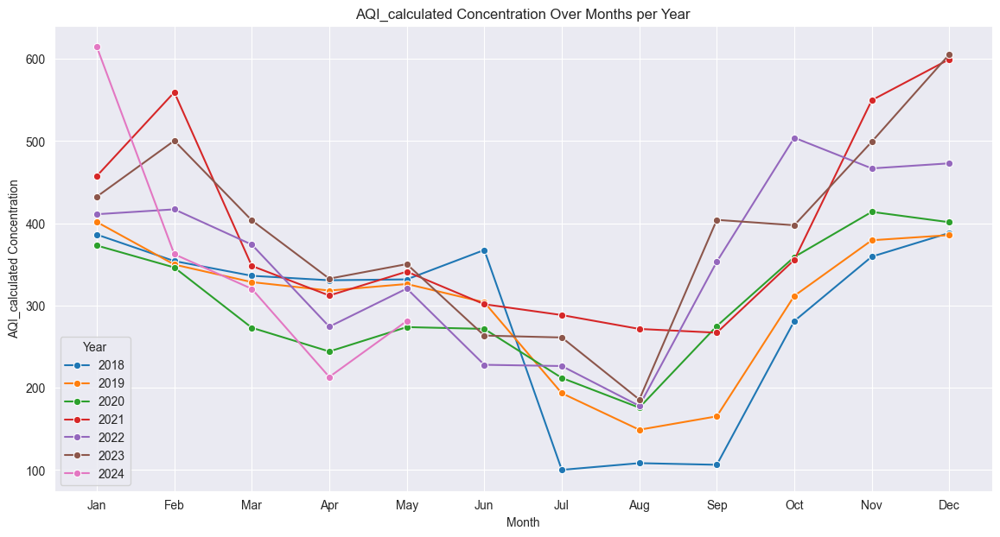

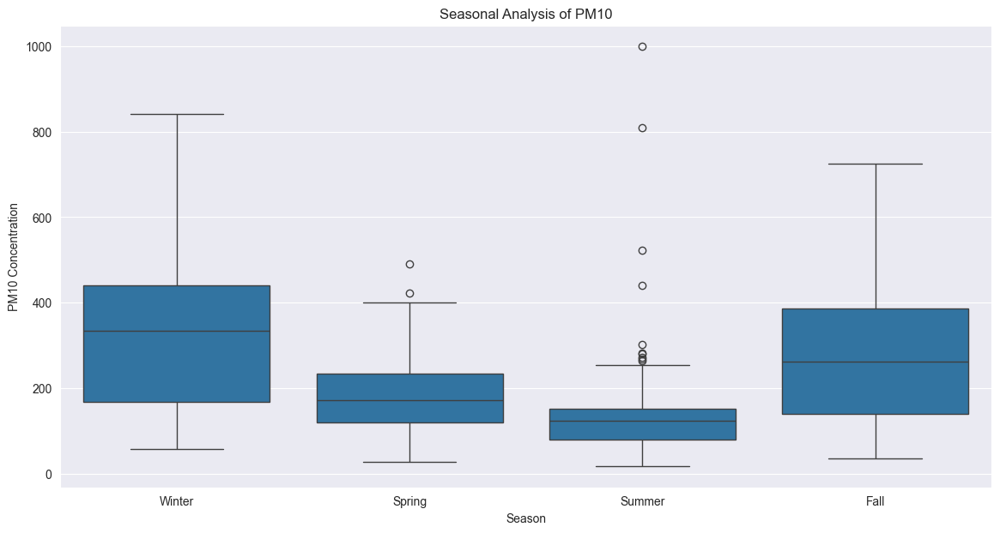

...

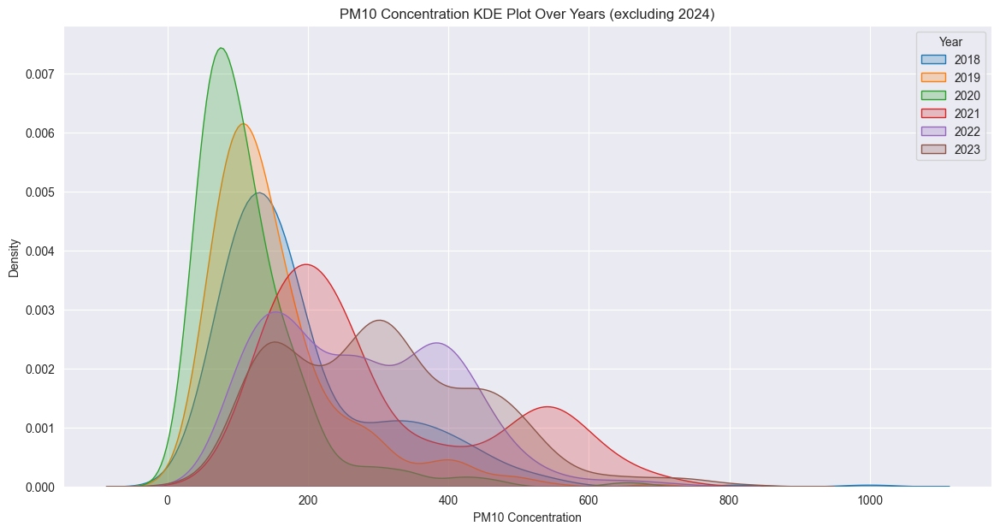

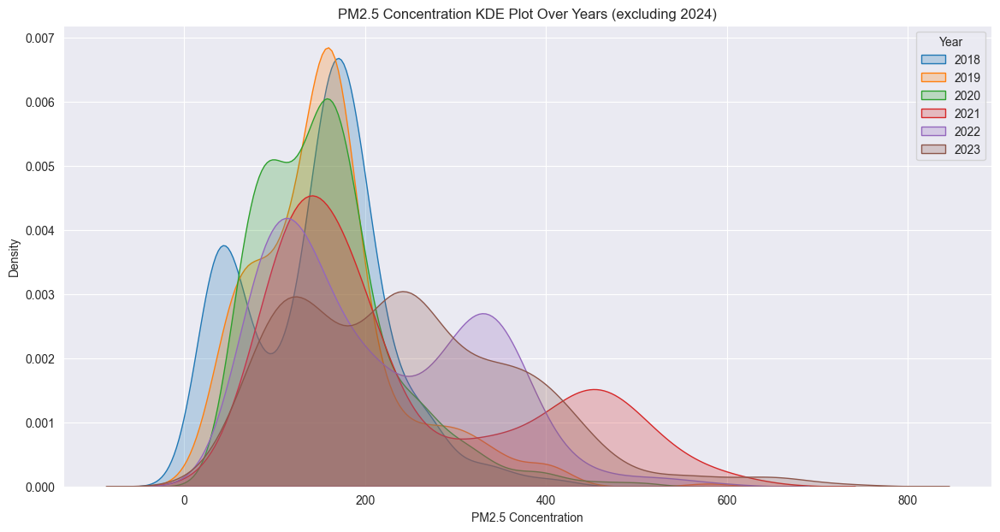

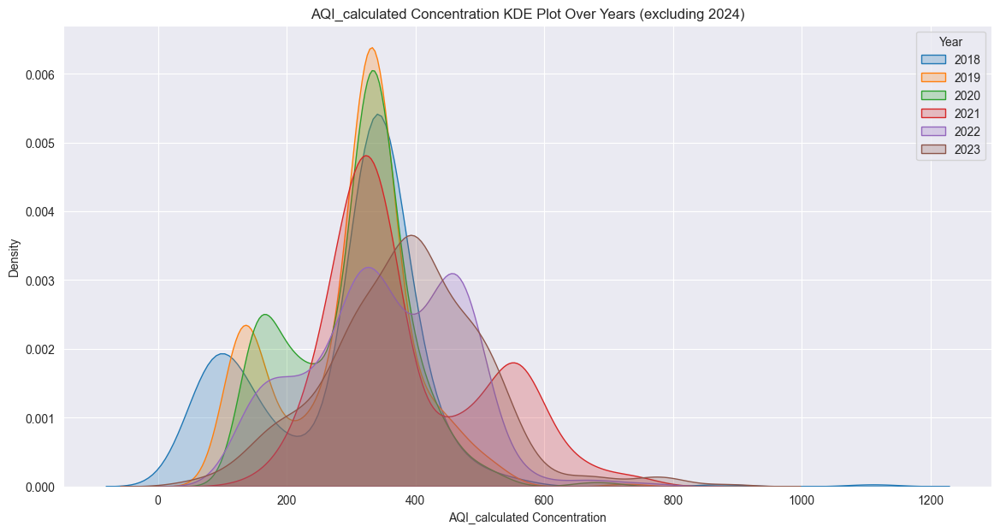

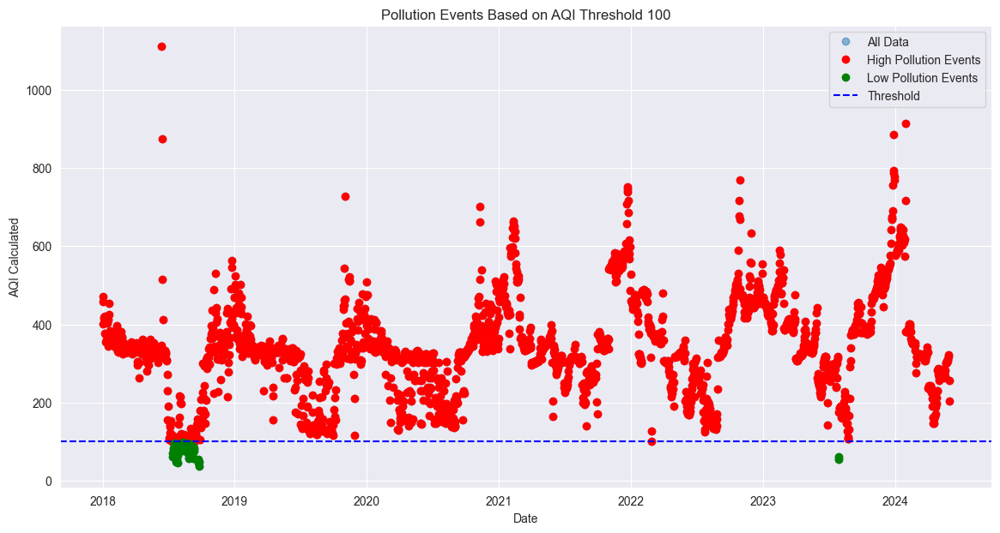

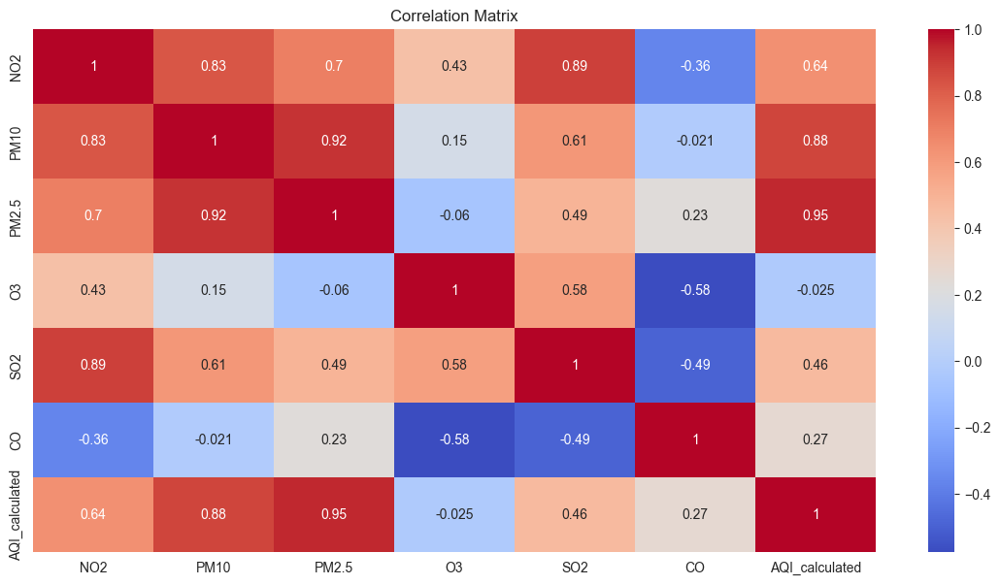

In [64]:
city_analyzer = AirQualityAnalyzer(df_Delhi, 'Delhi')
pollutants = [ 'PM10', 'PM2.5','AQI_calculated']
years = [2018,2019,2020,2021, 2022, 2023, 2024]
threshold = 100  
city_analyzer.analyze(pollutants, years, threshold)

## 6.2 Patna


In [65]:
df_Patna = new_df[new_df['city']=='Patna']

In [66]:
df_Patna[['NO2', 'PM10', 'PM2.5', 'O3', 'SO2', 'CO','AQI_calculated']].describe()

,NO2,PM10,PM2.5,O3,SO2,CO,AQI_calculated
count,2339.000000,1963.000000,2339.000000,2339.000000,2339.000000,2339.000000,2339.000000
mean,22.822415,126.341727,146.504384,51.732687,17.301017,4.000145,276.264643
std,17.251096,110.092760,80.826526,38.138834,9.960638,4.088670,114.645109
min,0.700000,0.000000,21.000000,1.000000,1.200000,0.290000,40.000000
25%,12.461000,44.552000,77.683500,15.550000,8.200000,1.098500,161.000000
50%,19.313000,94.511000,136.875000,51.836000,18.892000,1.790000,313.000000
75%,30.253334,197.213000,189.300500,74.683500,22.340500,6.400000,353.500000
max,373.399994,572.295000,520.670000,165.373000,89.519997,34.099998,608.000000


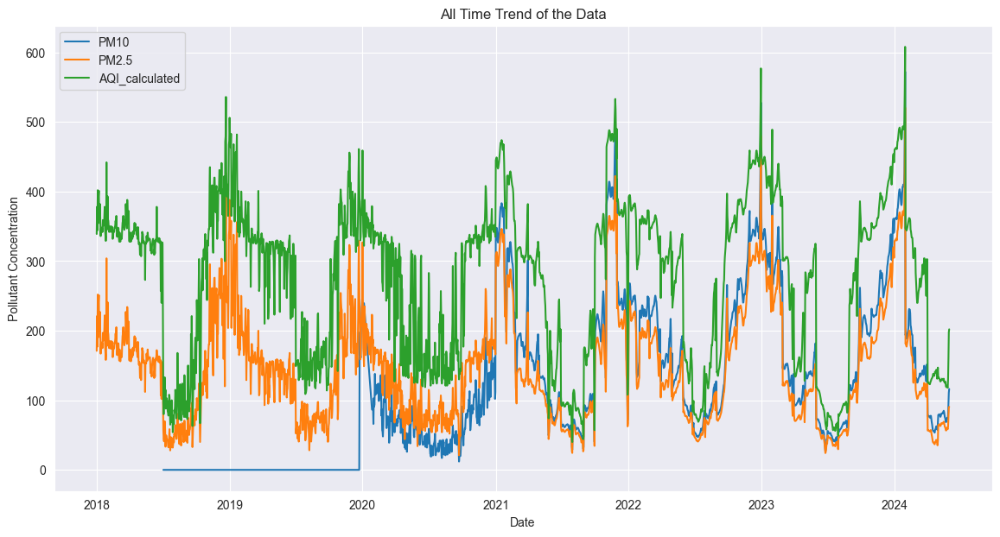

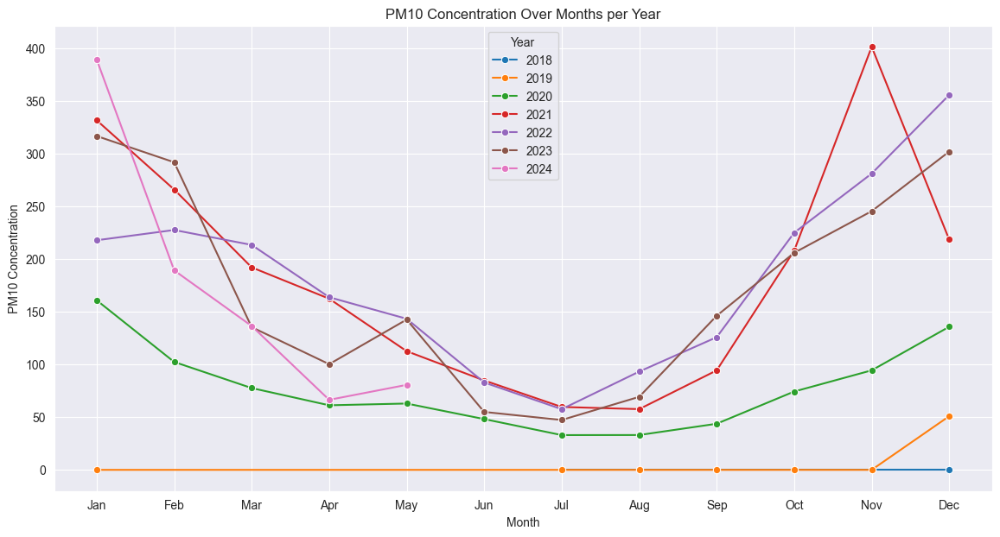

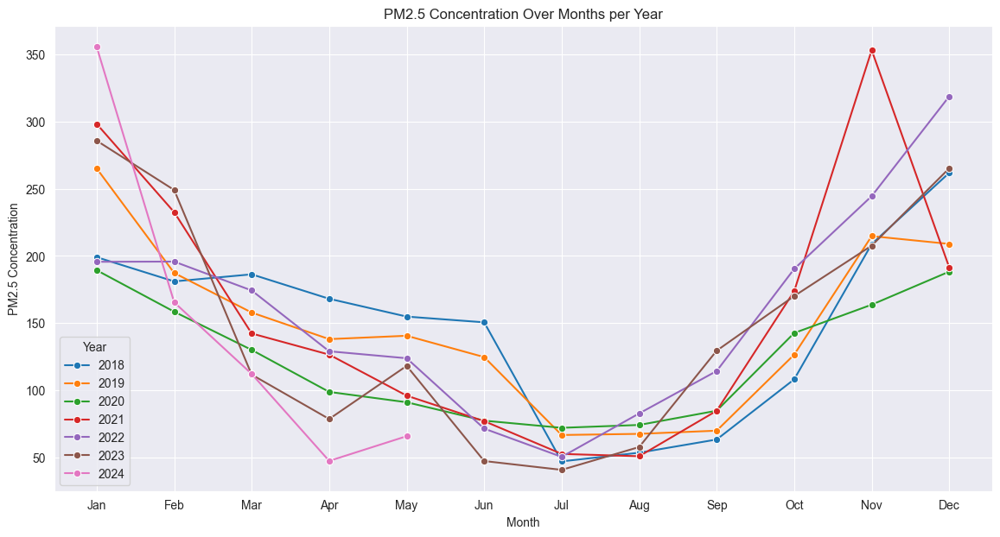

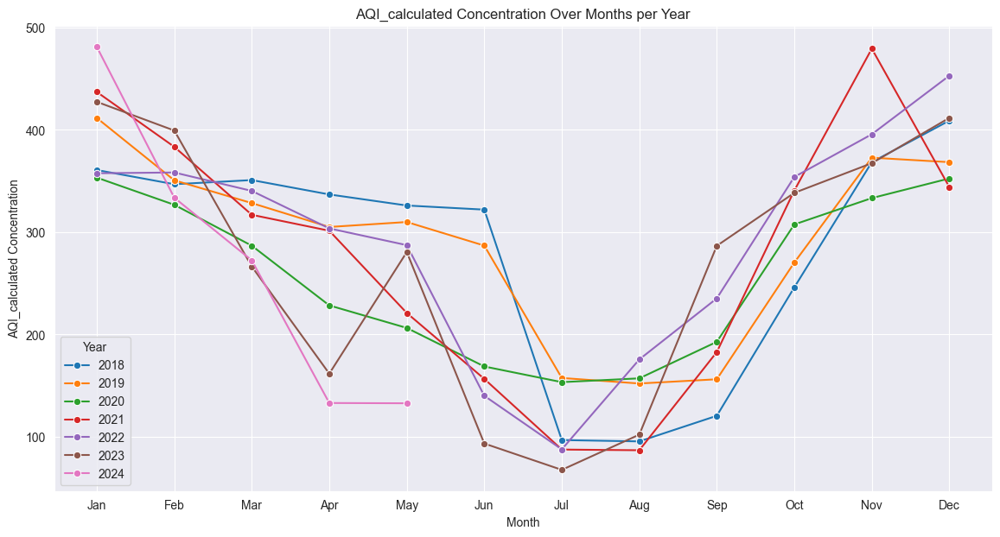

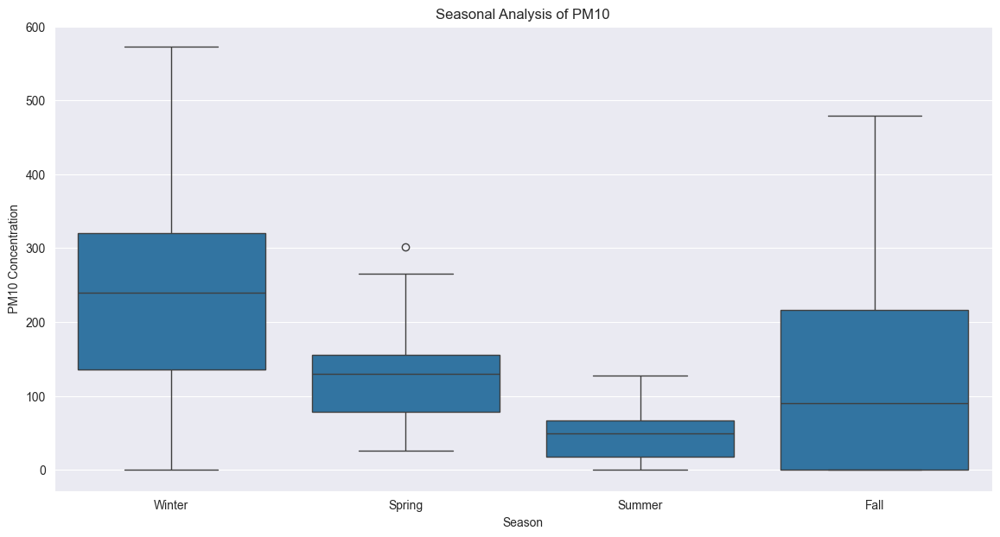

...

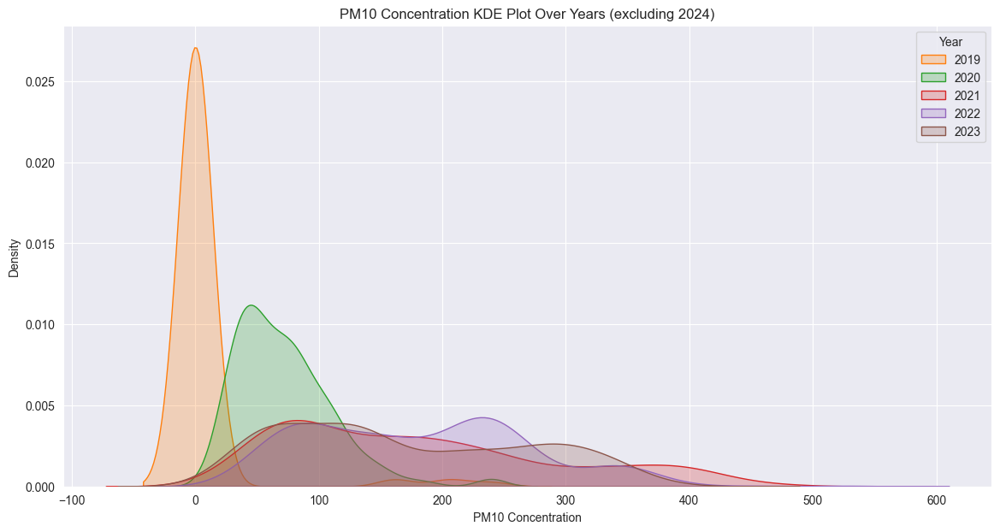

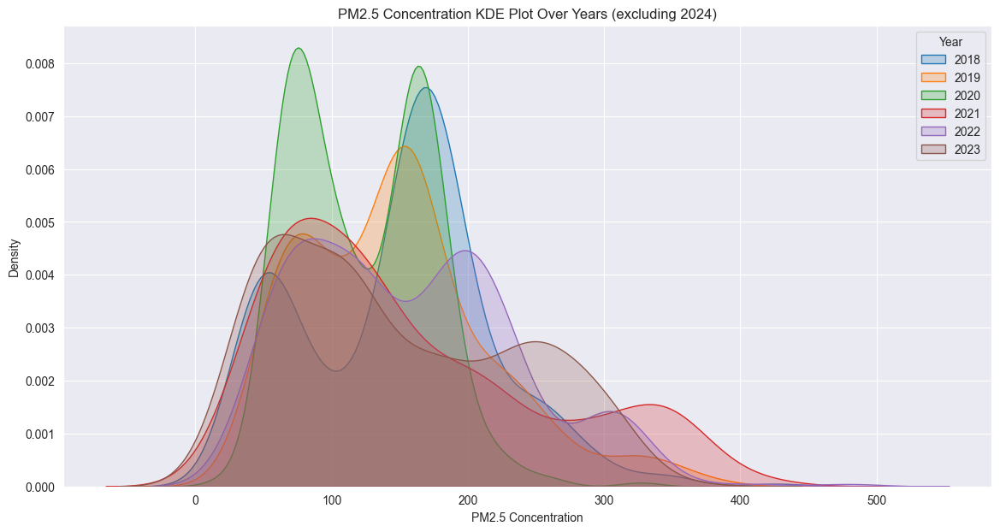

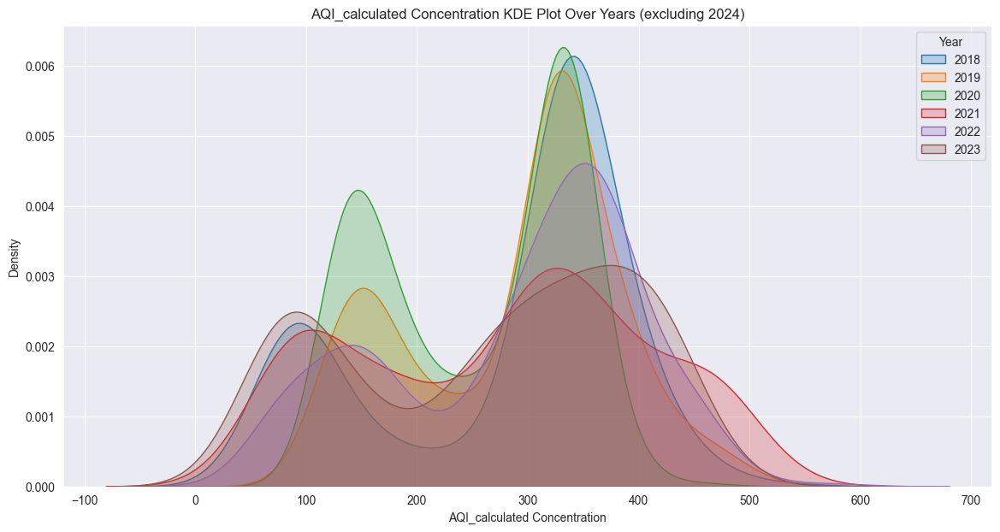

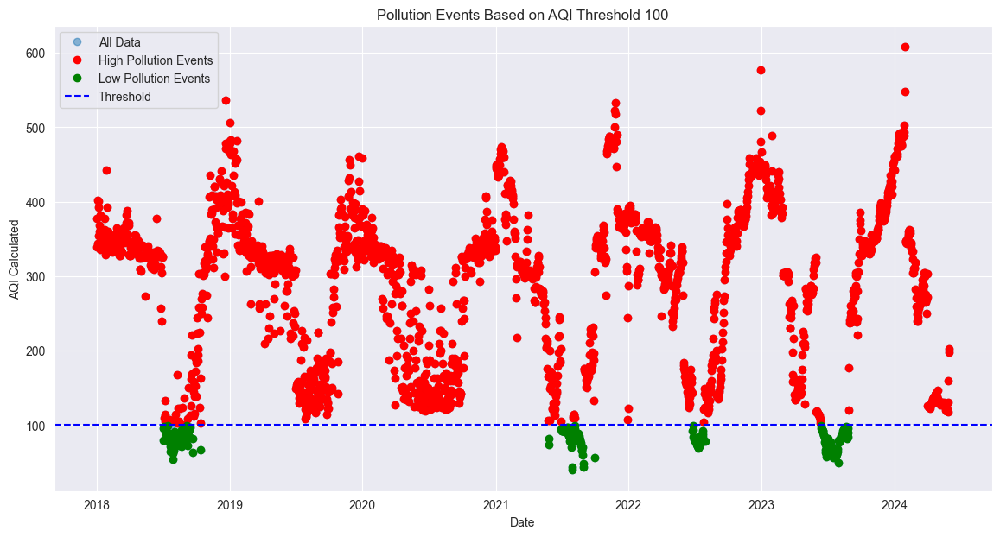

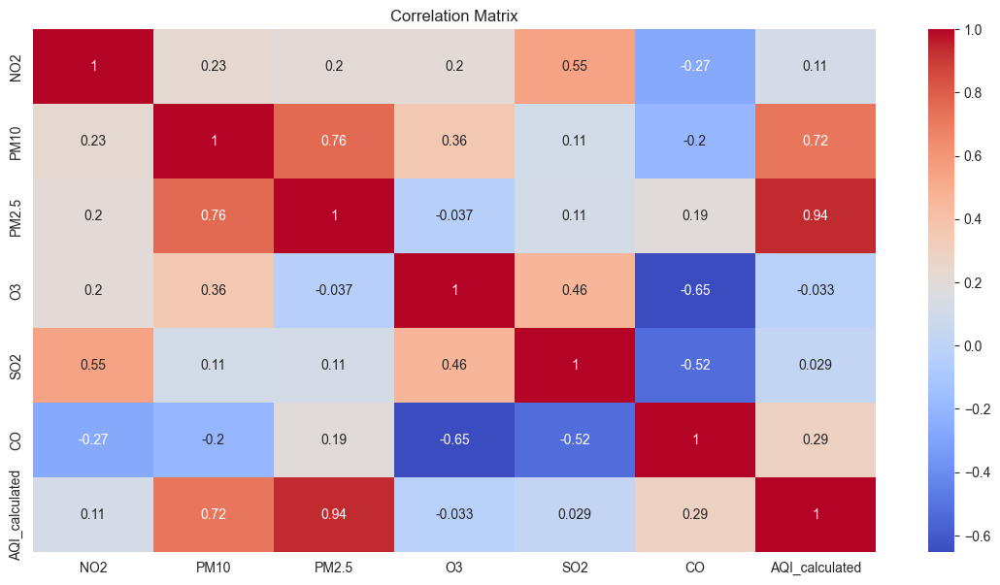

In [69]:
city_analyzer = AirQualityAnalyzer(df_Patna, 'Patna')
pollutants = ['PM10', 'PM2.5', 'AQI_calculated']
years = [2018,2019,2020,2021, 2022, 2023, 2024]
threshold = 100  
city_analyzer.analyze(pollutants, years, threshold)

## 6.3 Lucknow

In [70]:
df_Lucknow = new_df[new_df['city']=='Lucknow']

In [71]:
df_Lucknow[['NO2', 'PM10', 'PM2.5', 'O3', 'SO2', 'CO','AQI_calculated']].describe()

,NO2,PM10,PM2.5,O3,SO2,CO,AQI_calculated
count,2340.000000,1802.000000,2340.000000,2340.000000,2340.000000,2340.000000,2340.000000
mean,19.769304,118.123419,138.012250,48.230028,10.585874,3.931840,265.825214
std,11.651013,100.716347,74.979969,35.107142,7.286679,3.892816,116.180981
min,1.800000,0.000000,14.475000,1.000000,1.000000,0.446000,33.000000
25%,11.455000,43.001250,73.208499,15.500000,3.881250,0.968750,153.000000
50%,17.881000,101.312500,138.248501,48.289499,8.653750,1.538500,314.000000
75%,26.255250,186.982000,184.545750,73.840250,17.569250,7.100000,350.000000
max,90.949997,500.000000,435.245000,166.415000,36.885000,21.799999,542.000000


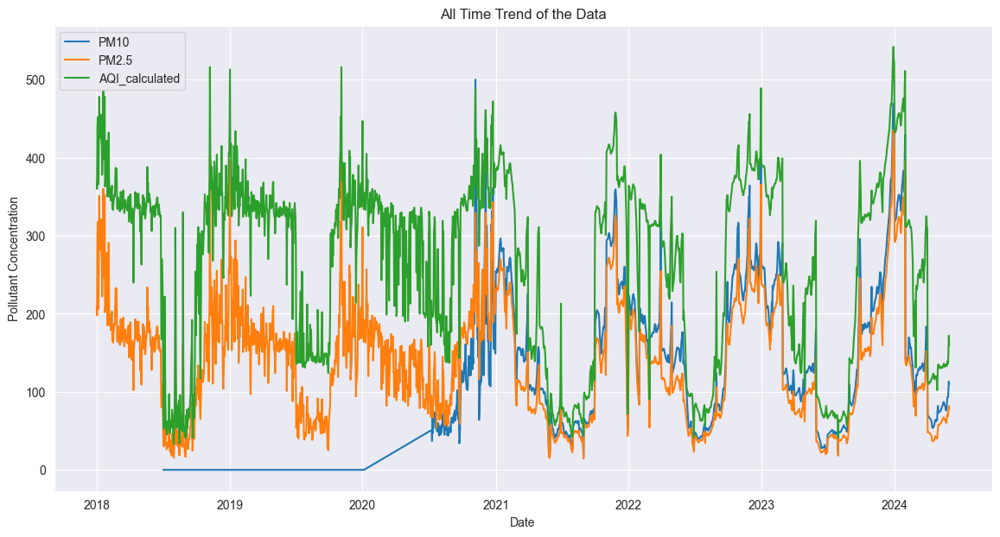

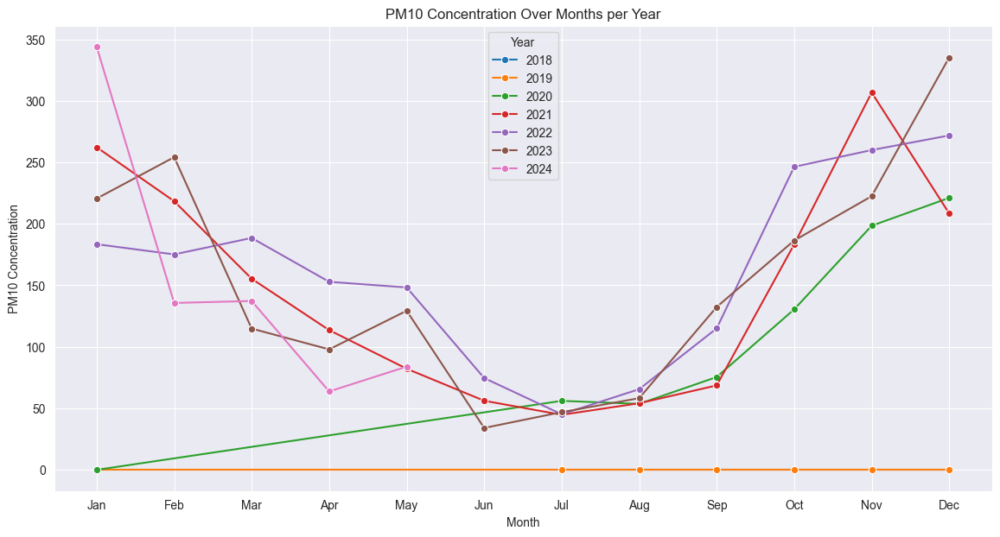

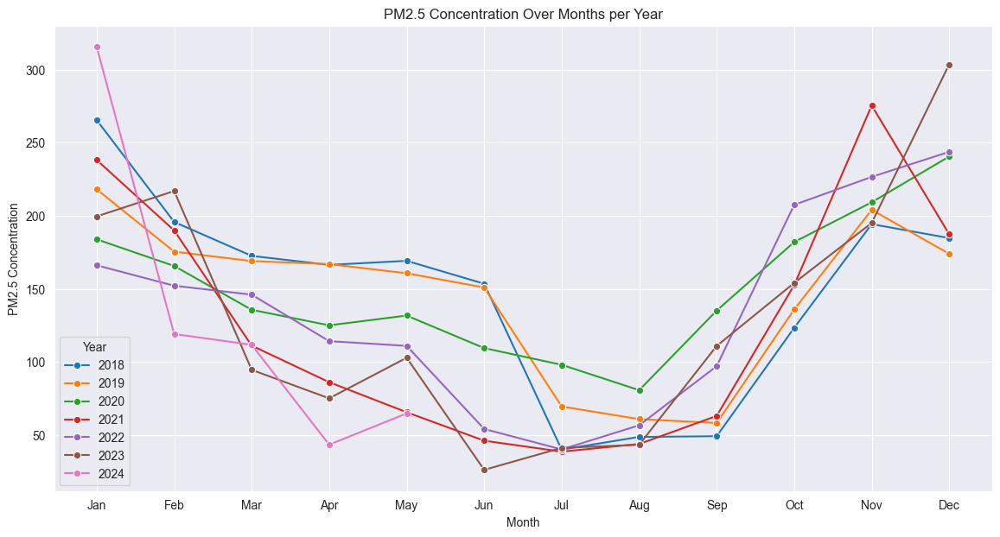

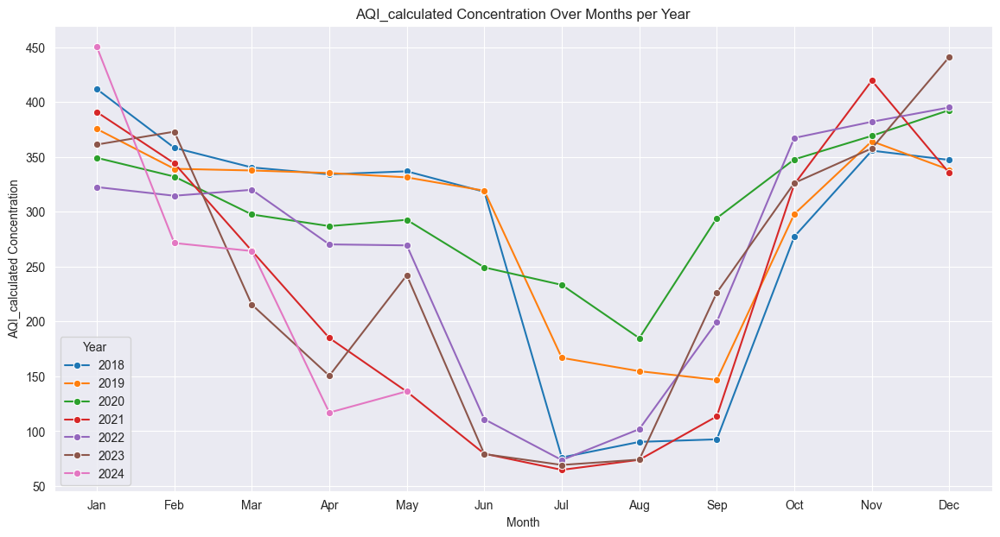

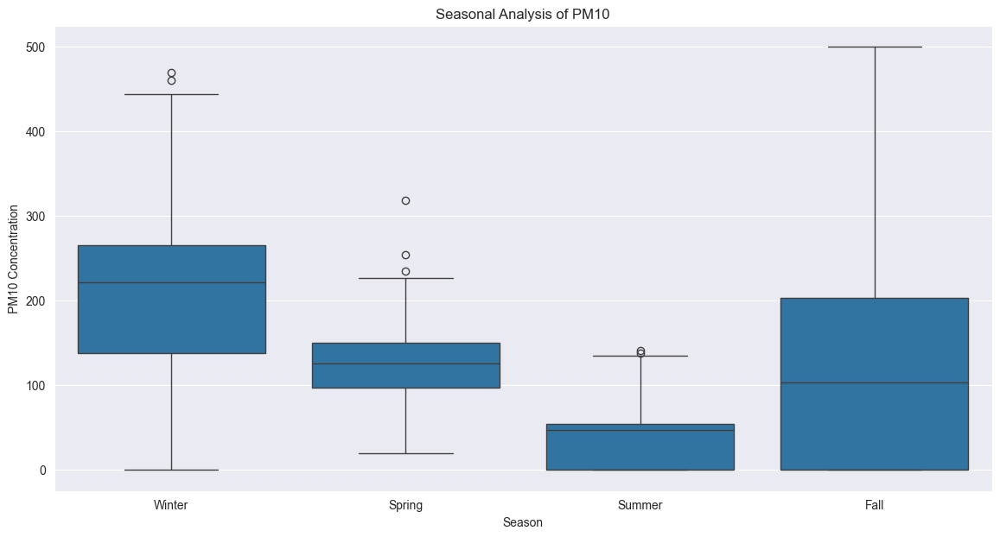

...

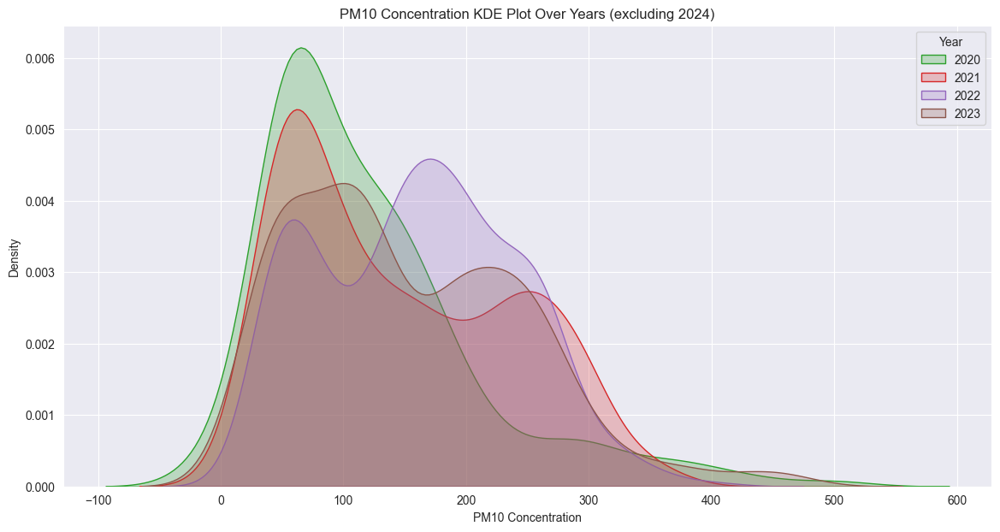

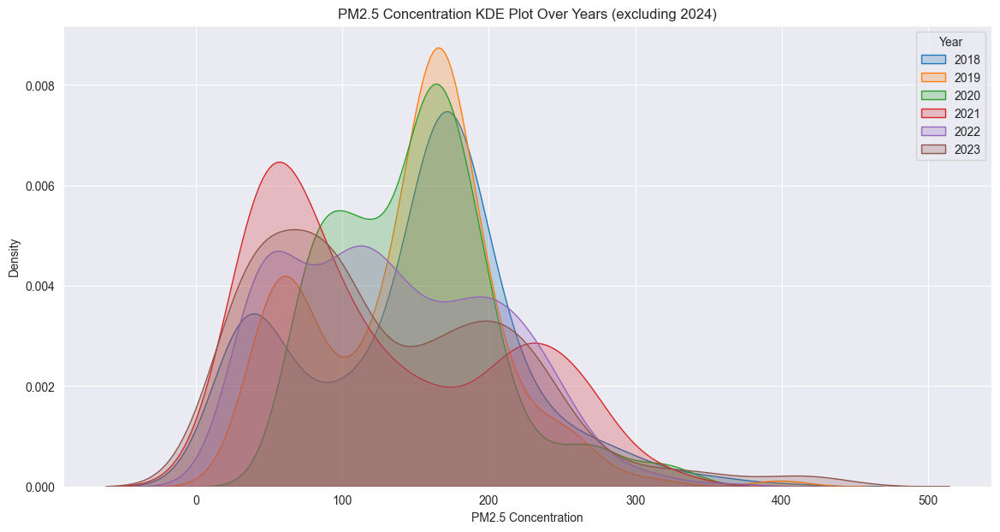

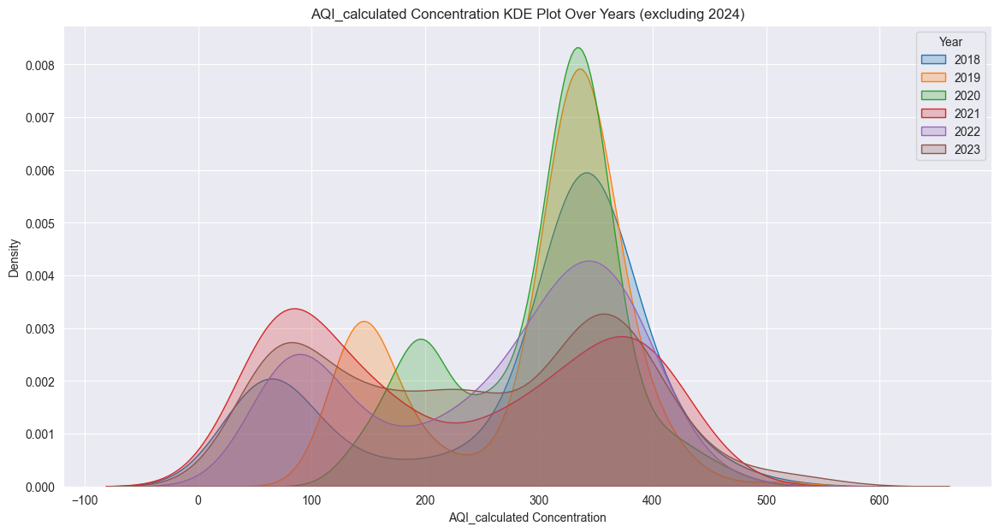

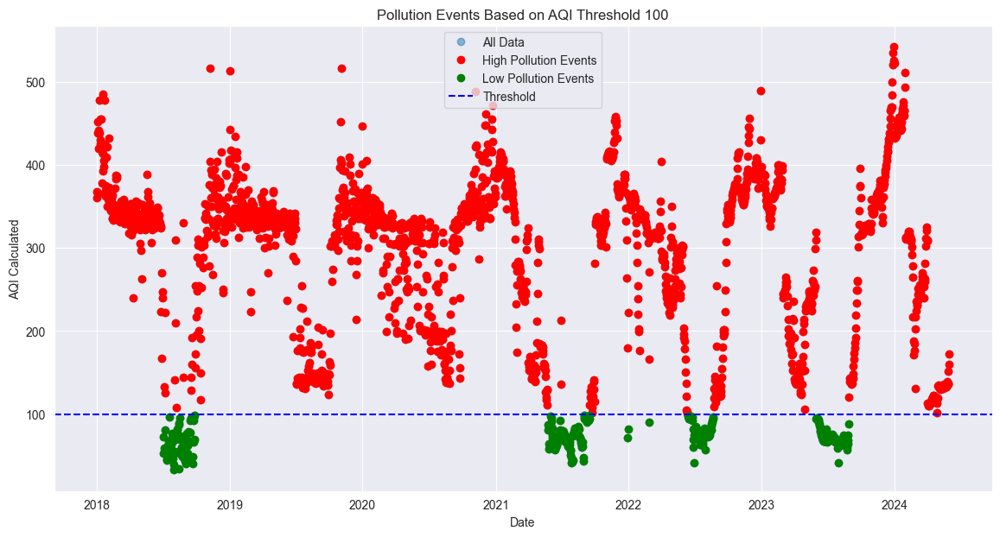

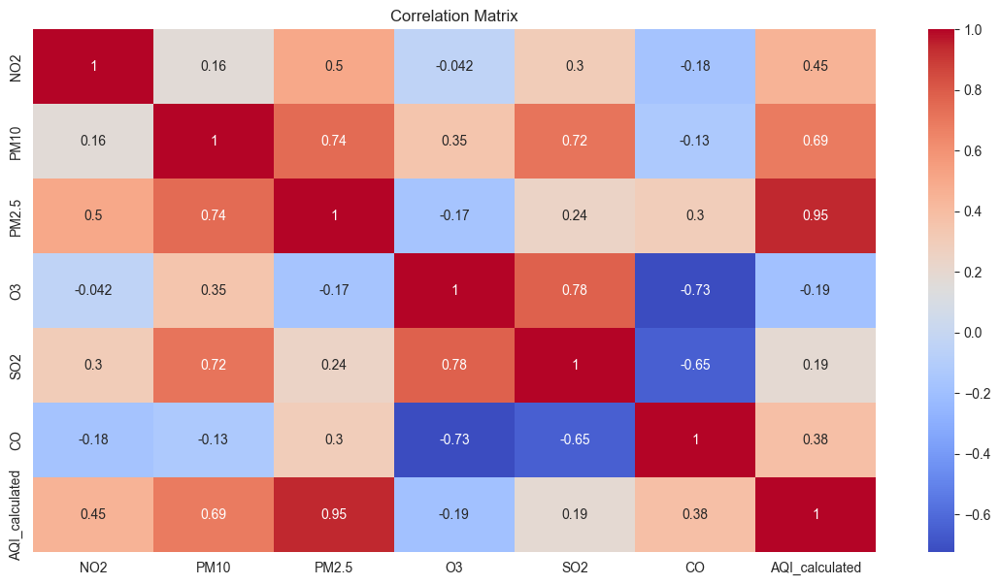

In [72]:
city_analyzer = AirQualityAnalyzer(df_Lucknow, 'Lucknow')
pollutants = ['PM10', 'PM2.5', 'AQI_calculated']
years = [2018,2019,2020,2021, 2022, 2023, 2024]
threshold = 100  
city_analyzer.analyze(pollutants, years, threshold)

## 6.4 Chandigarh

In [73]:
df_Chandigarh = new_df[new_df['city']=='Chandigarh']

In [74]:
df_Chandigarh[['NO2', 'PM10', 'PM2.5', 'O3', 'SO2', 'CO','AQI_calculated']].describe()

,NO2,PM10,PM2.5,O3,SO2,CO,AQI_calculated
count,2043.000000,1817.000000,2043.000000,2043.000000,2043.000000,2043.000000,2043.000000
mean,16.656662,89.711173,88.877254,55.227057,12.008930,2.139723,193.196769
std,8.988431,40.466624,41.859452,39.490360,7.023287,1.945234,90.435157
min,3.600000,14.000000,13.979000,1.000000,1.300000,0.435000,47.000000
25%,9.950000,58.183000,57.431000,14.700000,4.700000,0.781000,114.000000
50%,14.649000,82.185000,79.762000,55.770000,13.369000,1.043000,167.000000
75%,20.829000,112.280000,116.657000,84.247250,17.976500,3.300000,289.000000
max,49.765000,289.705002,217.000000,181.650000,34.037000,13.900000,375.000000


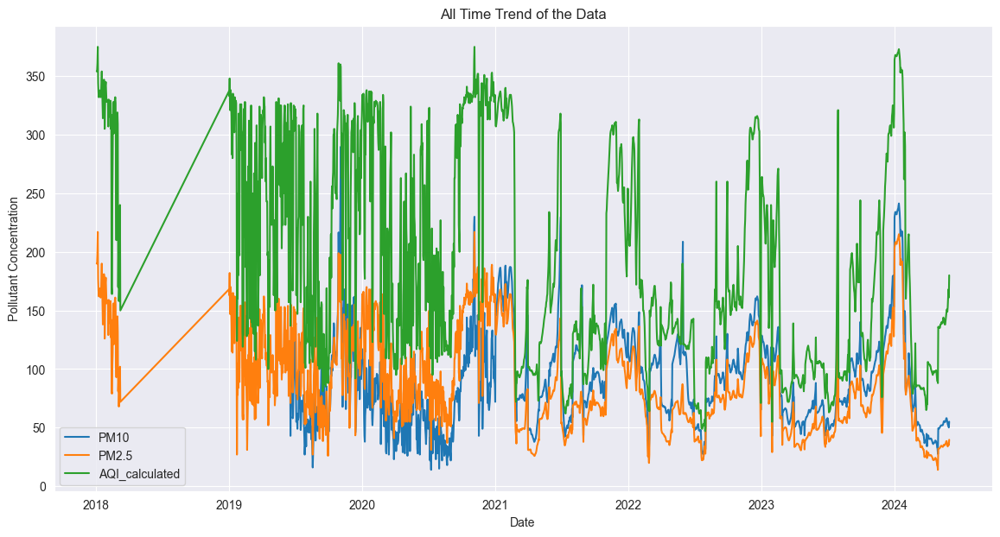

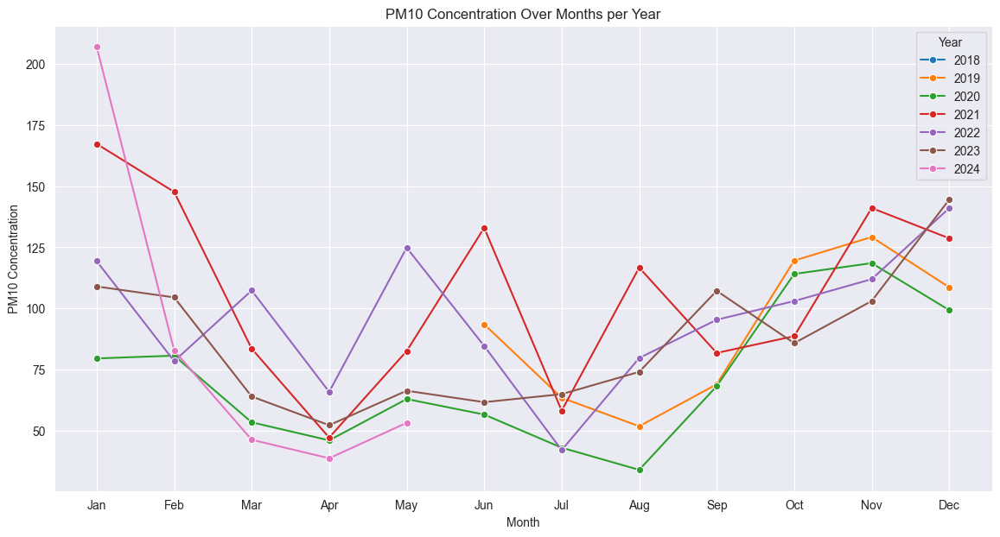

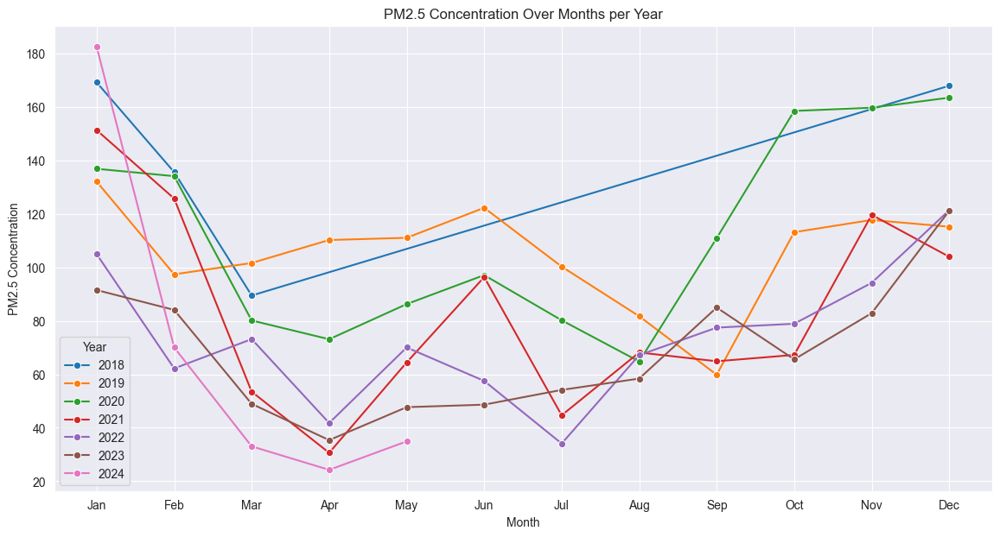

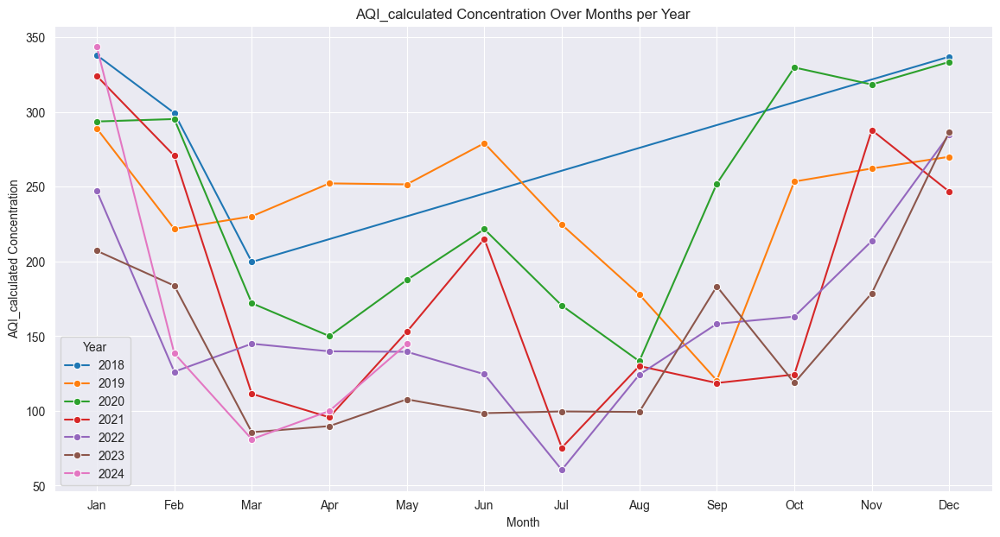

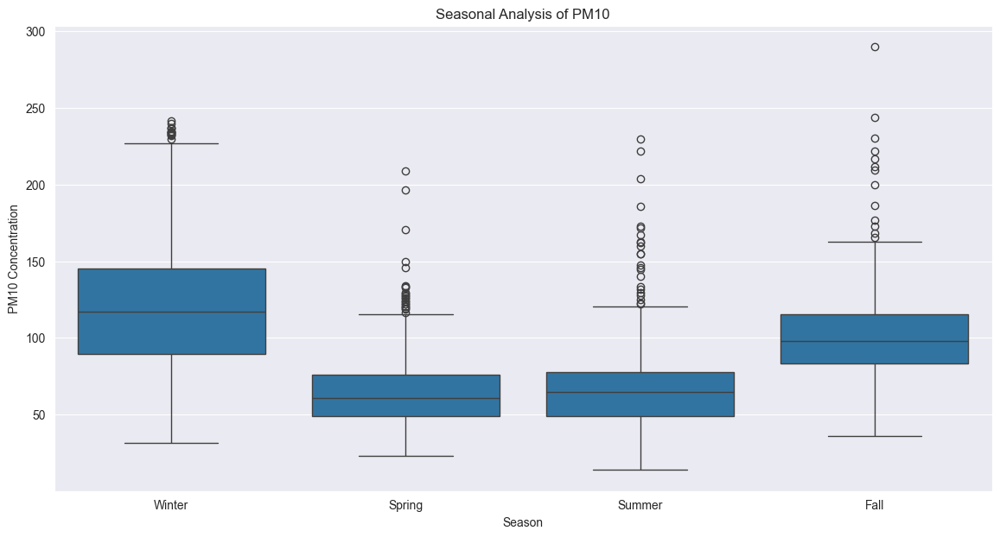

...

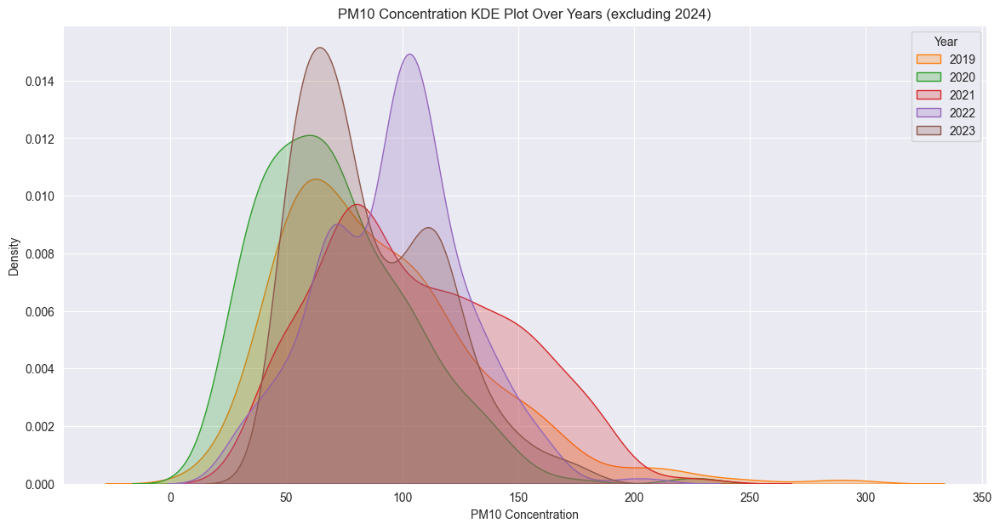

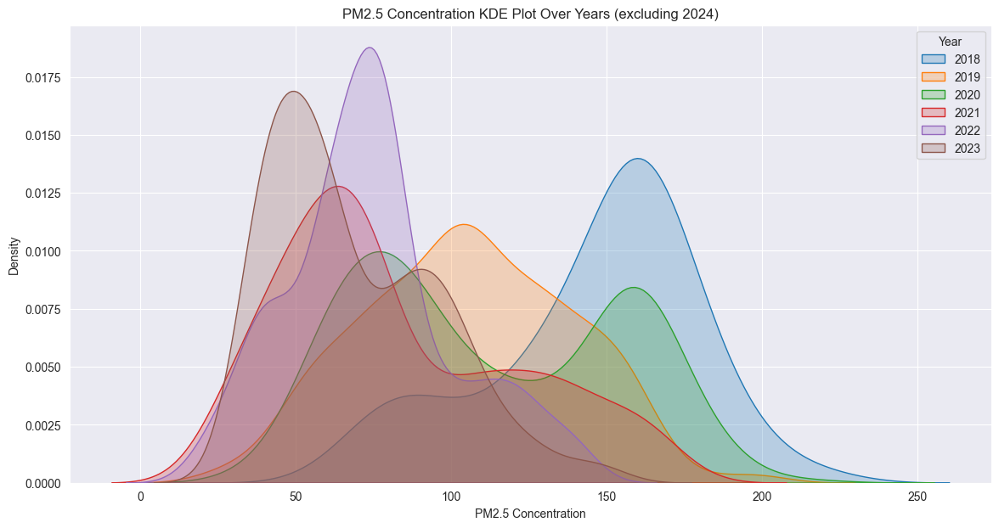

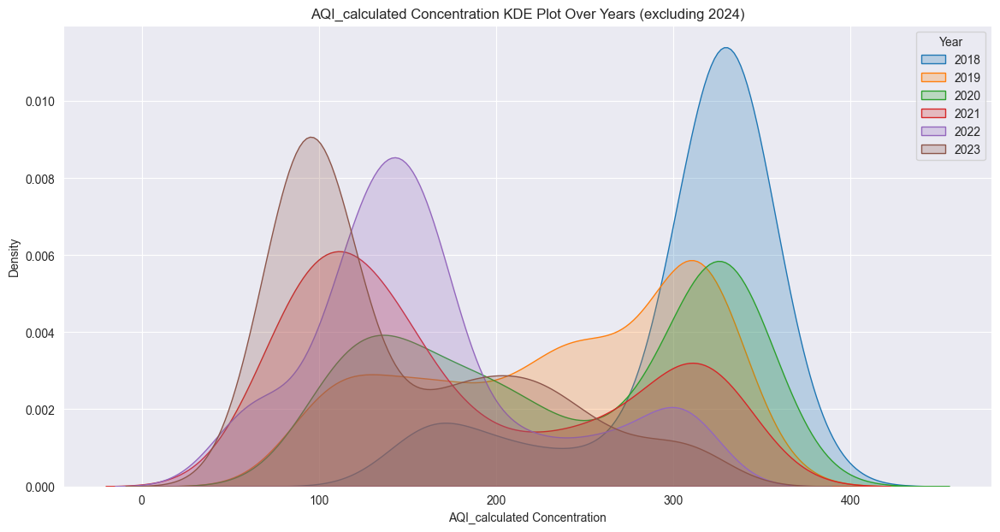

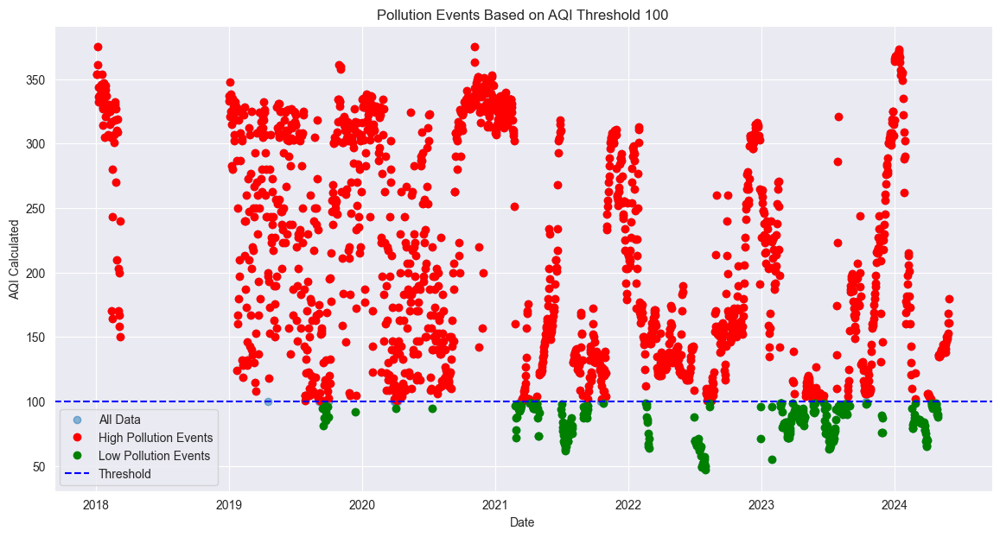

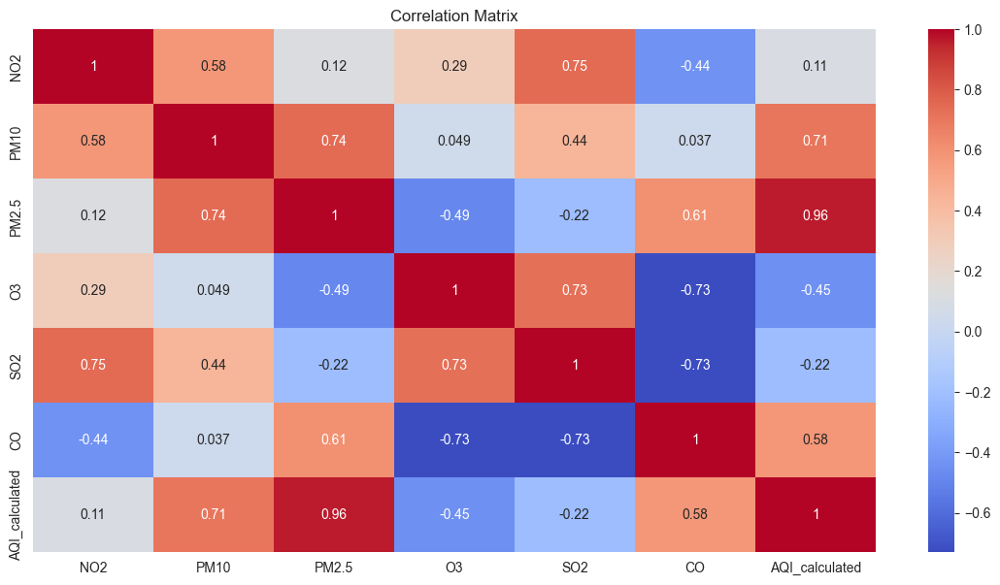

In [75]:
city_analyzer = AirQualityAnalyzer(df_Chandigarh, 'Chandigarh')
pollutants = ['PM10', 'PM2.5', 'AQI_calculated']
years = [2018,2019,2020,2021, 2022, 2023, 2024]
threshold = 100  
city_analyzer.analyze(pollutants, years, threshold)

## 6.5 Jaipur


In [77]:
df_Jaipur = new_df[new_df['city']=='Jaipur']

In [78]:
df_Jaipur[['NO2', 'PM10', 'PM2.5', 'O3', 'SO2', 'CO','AQI_calculated']].describe()

,NO2,PM10,PM2.5,O3,SO2,CO,AQI_calculated
count,2340.000000,2340.000000,2340.000000,2340.000000,2340.000000,2340.000000,2340.000000
mean,17.054005,88.919338,82.248817,51.040192,9.439420,2.822343,183.487607
std,9.539079,40.722689,42.977759,30.031473,3.969243,2.910388,97.187765
min,3.200000,8.312000,5.751000,1.000000,1.500000,0.263000,26.000000
25%,10.111750,60.164000,45.043250,22.672500,5.900000,0.619000,99.000000
50%,14.354000,81.000000,74.805499,50.856000,8.918500,1.014000,155.500000
75%,22.385000,114.292251,117.000000,78.259000,12.467000,5.000000,290.000000
max,68.000000,297.169000,283.709000,141.000000,27.320000,15.700000,426.000000


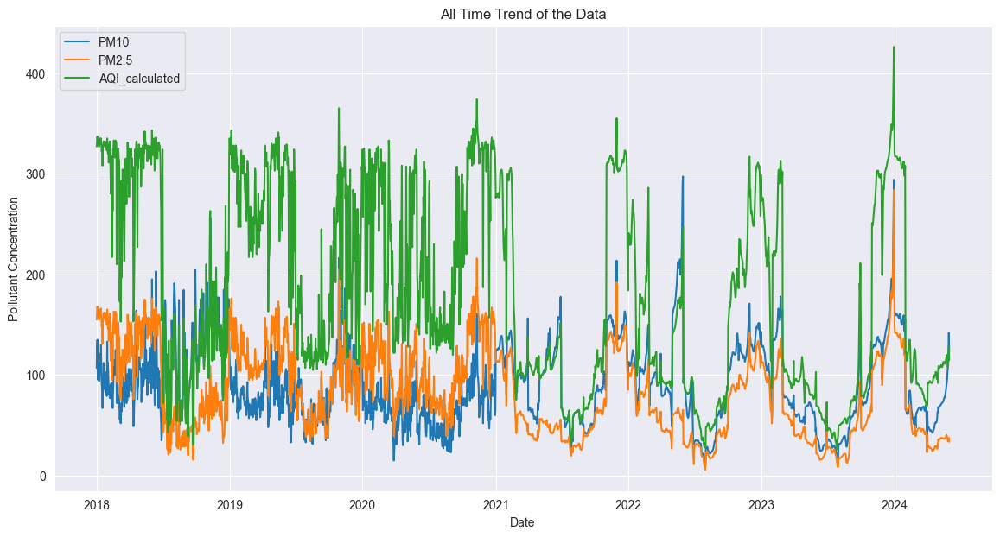

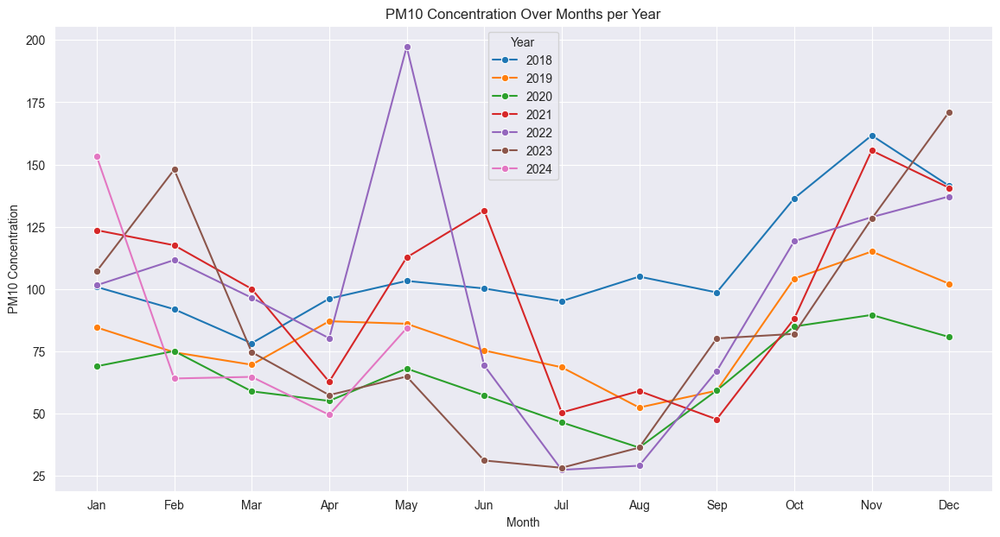

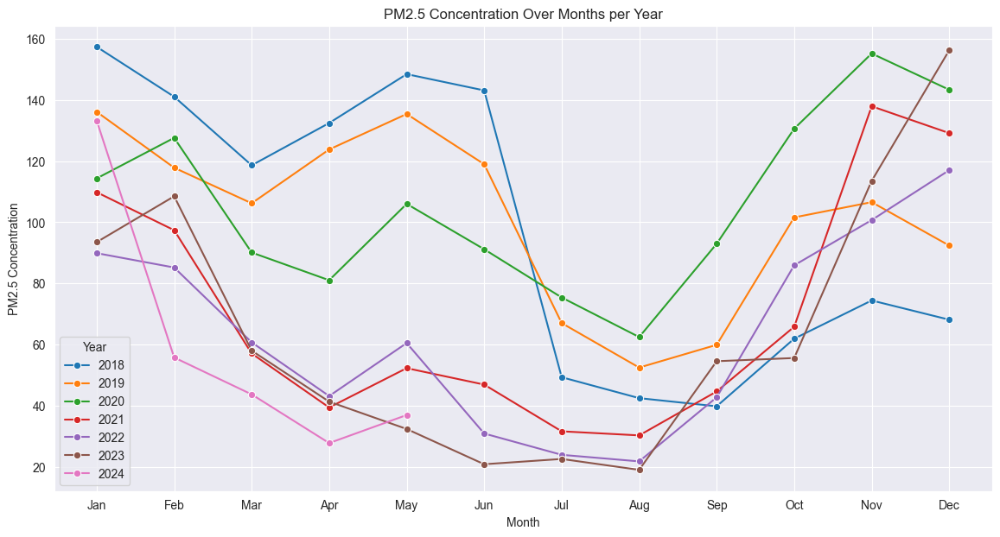

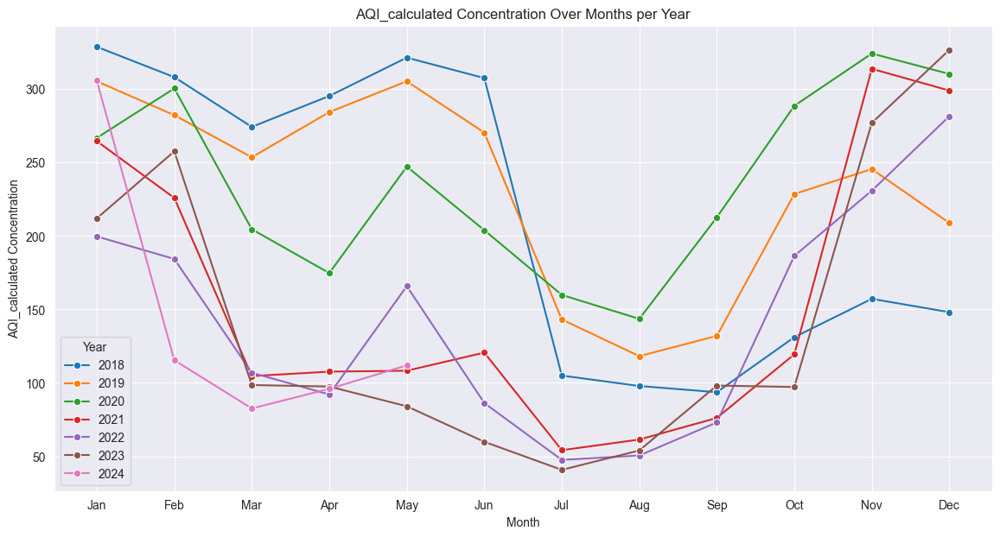

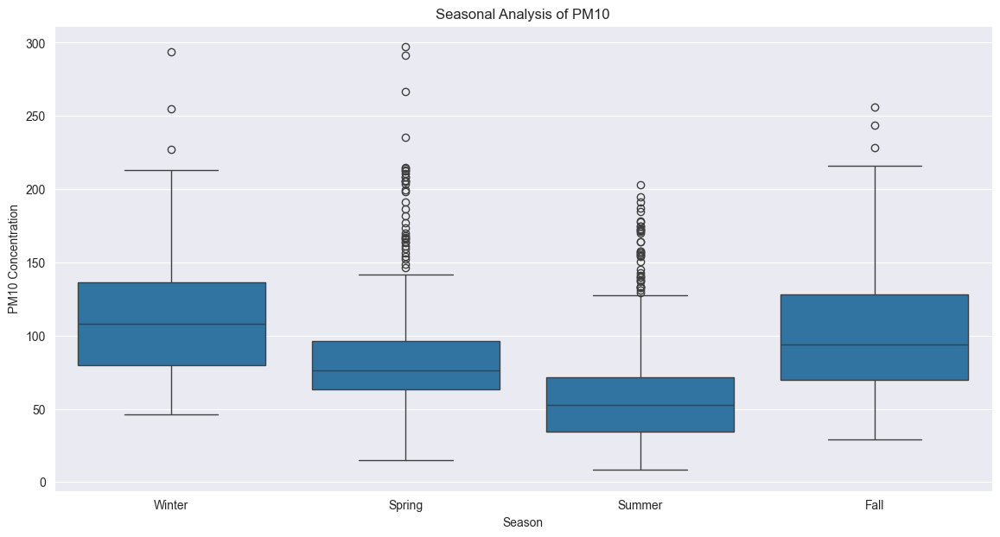

...

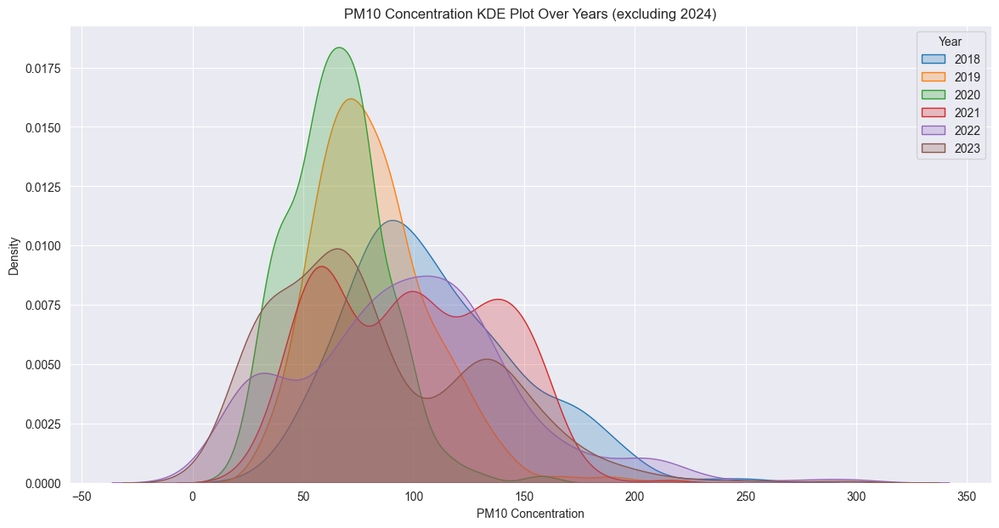

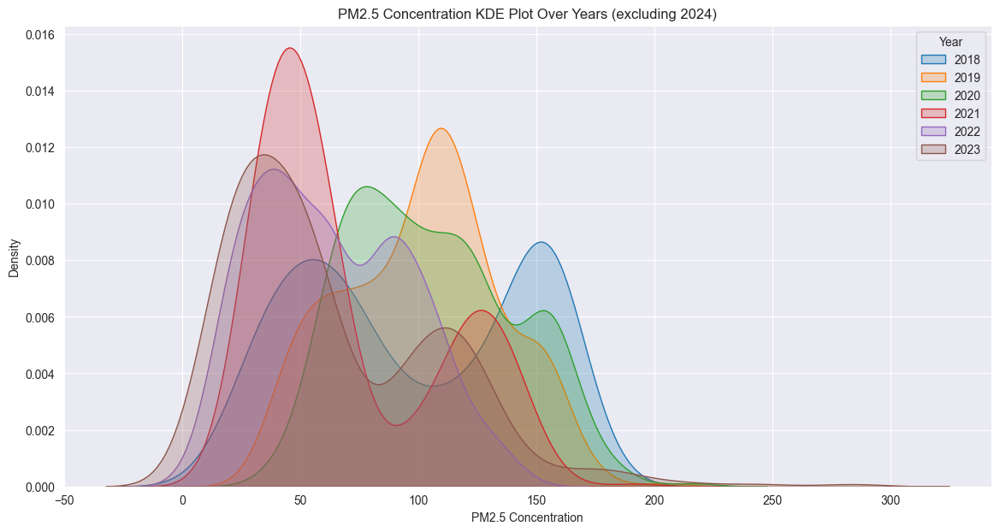

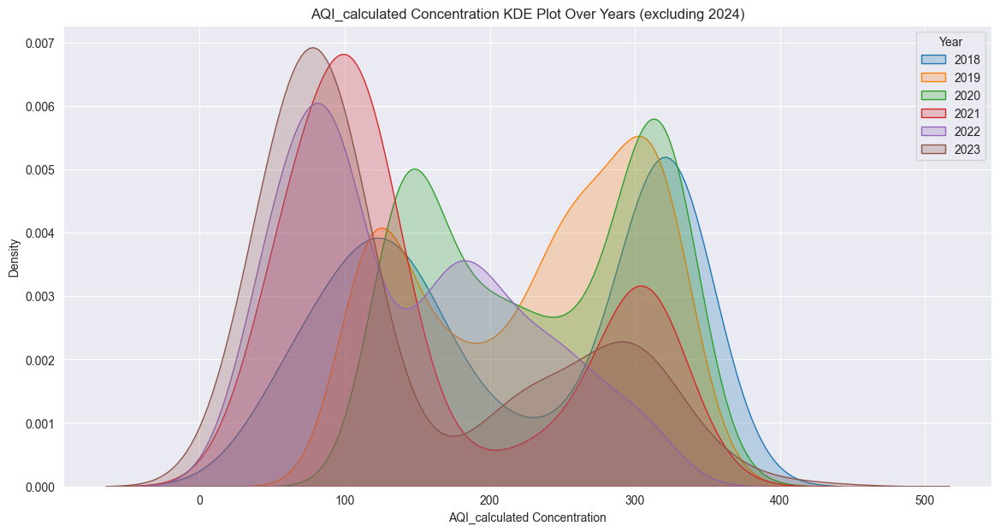

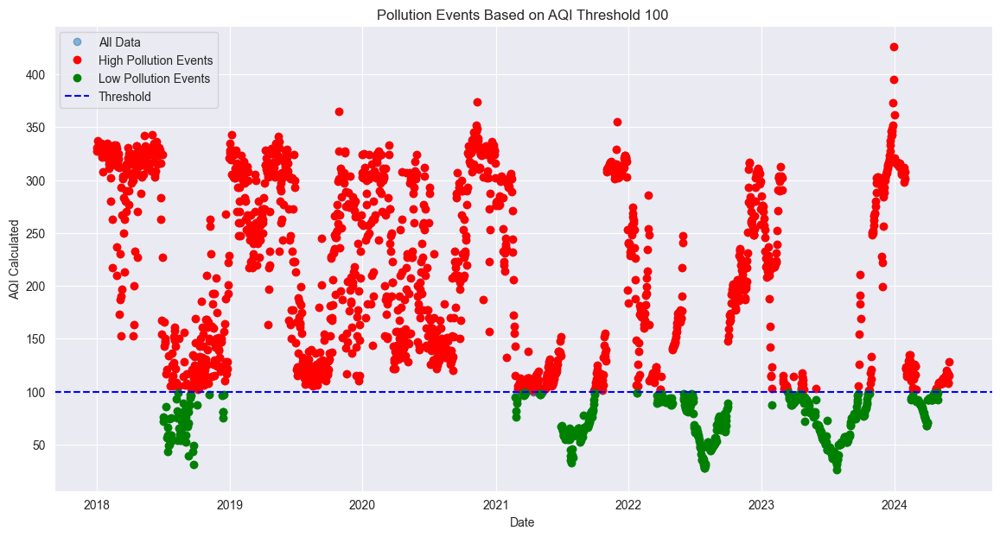

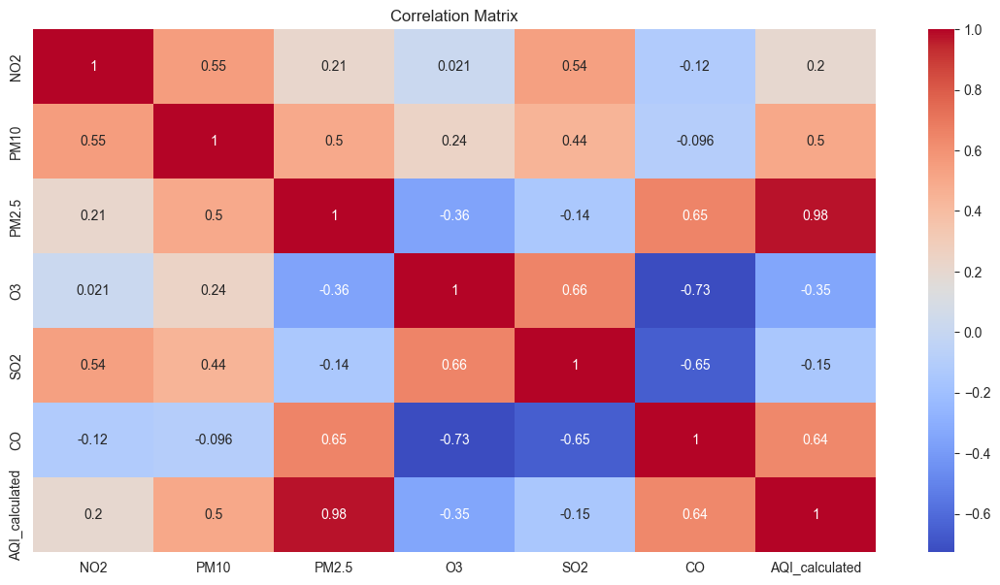

In [79]:
city_analyzer = AirQualityAnalyzer(df_Jaipur, 'Jaipur')
pollutants = ['PM10', 'PM2.5', 'AQI_calculated']
years = [2018,2019,2020,2021, 2022, 2023, 2024]
threshold = 100  
city_analyzer.analyze(pollutants, years, threshold)

## 6.6 Hyderabad

In [80]:
df_Hyderabad = new_df[new_df['city']=='Hyderabad']

In [81]:
df_Hyderabad[['NO2', 'PM10', 'PM2.5', 'O3', 'SO2', 'CO','AQI_calculated']].describe()

,NO2,PM10,PM2.5,O3,SO2,CO,AQI_calculated
count,2341.000000,2341.000000,2341.000000,2341.000000,2341.000000,2341.000000,2341.000000
mean,24.778536,77.128332,72.240815,37.027327,14.288054,1.825199,157.126442
std,14.340309,45.101776,45.512580,24.377196,11.826938,1.577266,101.185631
min,2.200000,4.187000,2.851000,1.000000,1.000000,0.220000,13.000000
25%,12.300000,41.540000,34.000000,14.050000,3.970000,0.670000,76.000000
50%,22.670000,73.000000,68.520000,29.893000,9.154000,1.252000,132.000000
75%,34.928000,107.667000,103.000000,58.341000,25.165000,2.500000,243.000000
max,72.800000,234.649000,208.913000,91.345000,53.037000,9.300000,368.000000


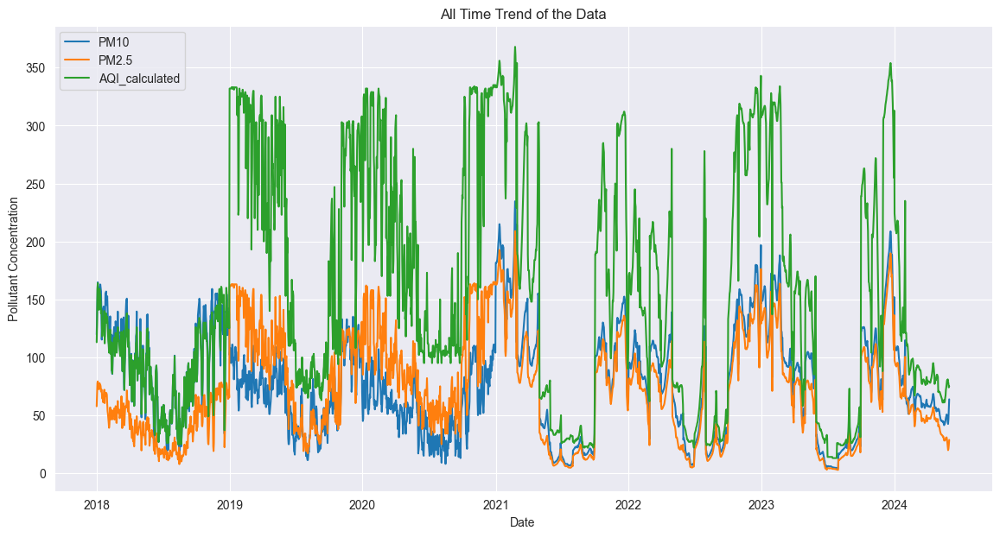

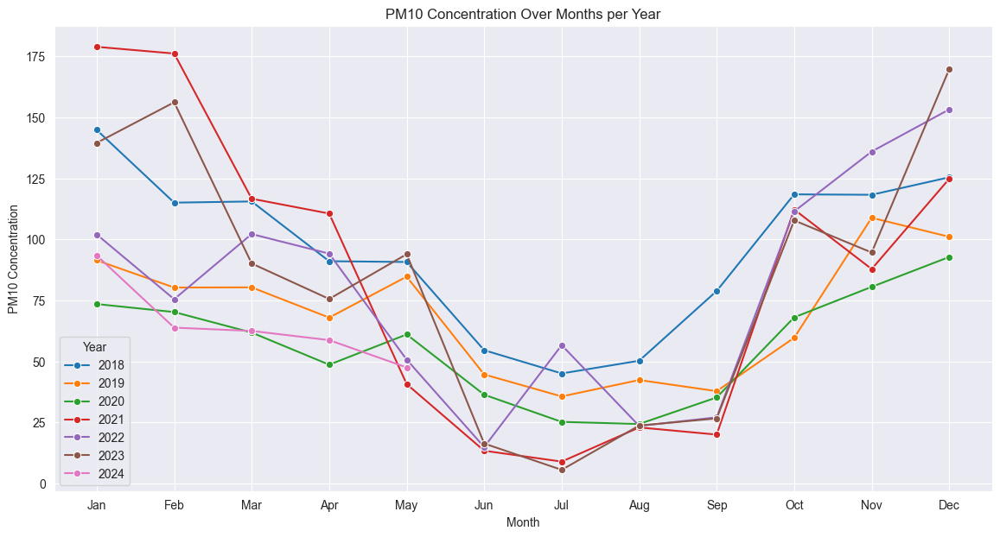

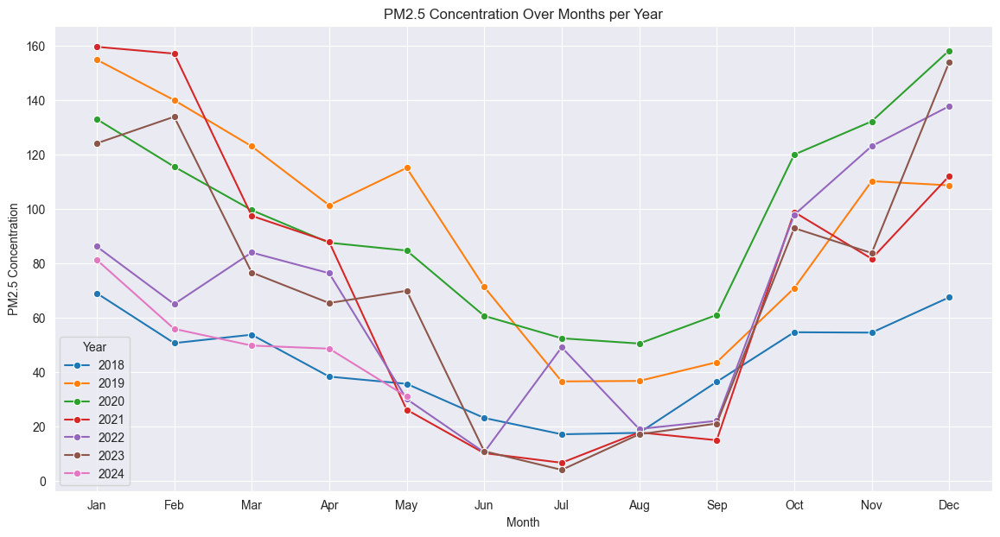

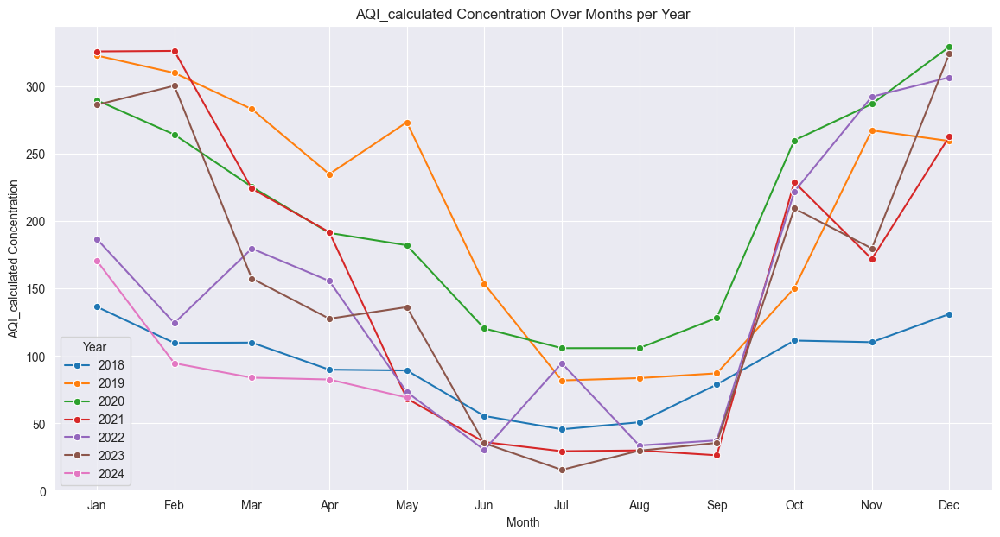

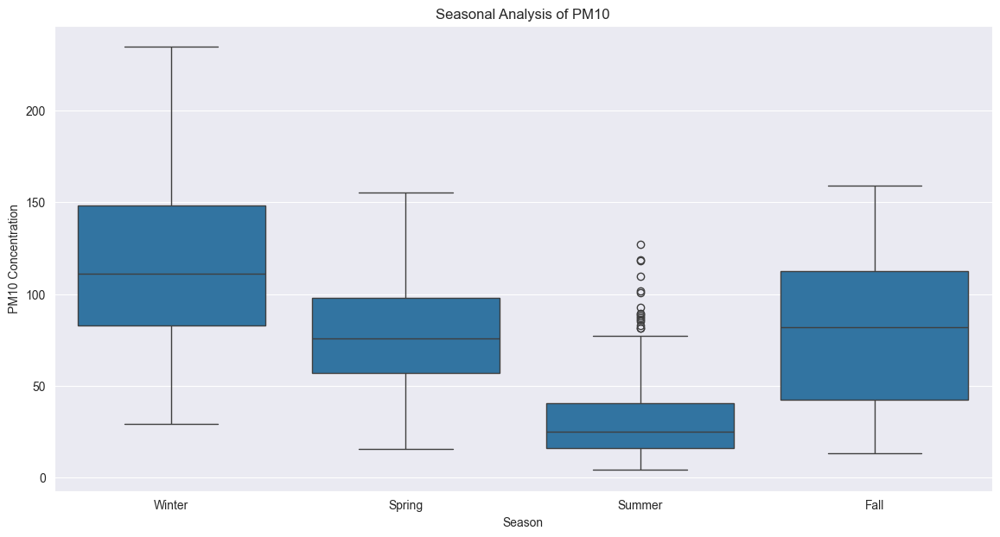

...

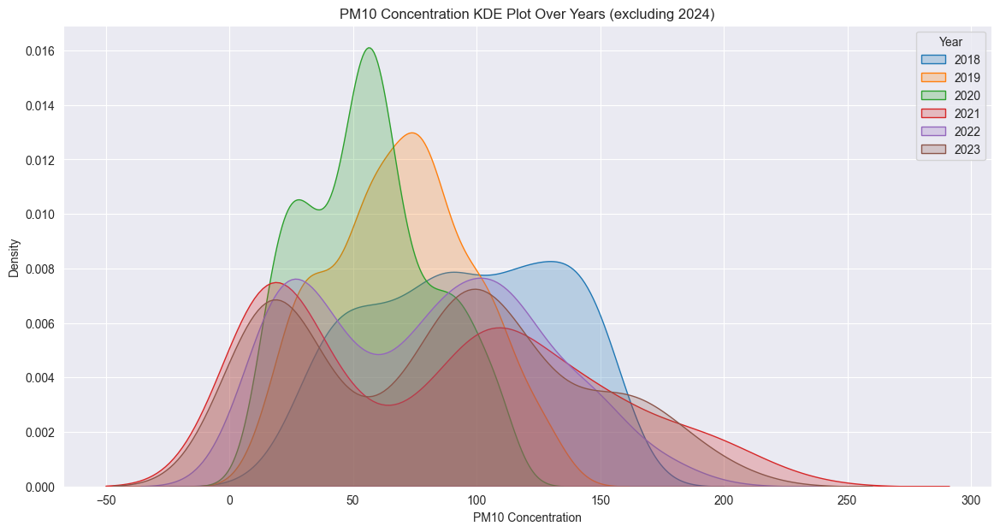

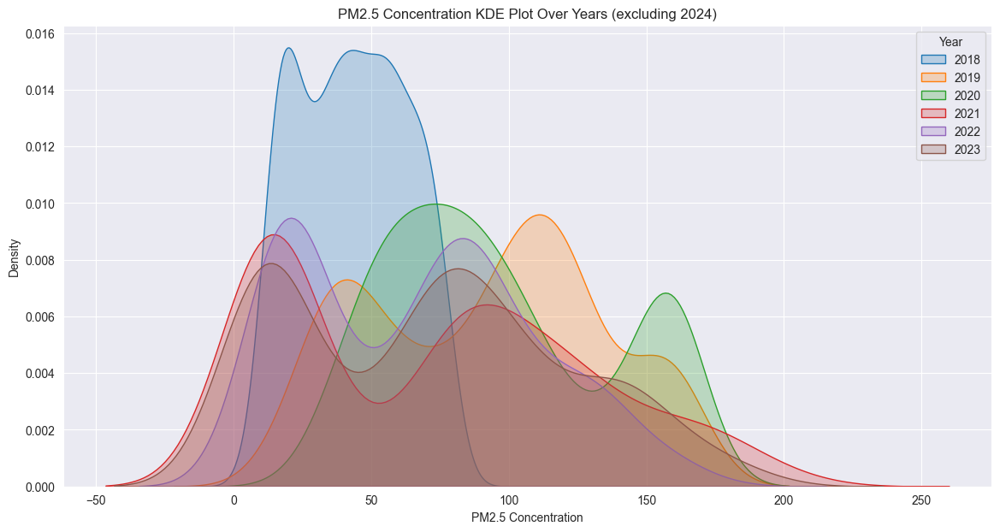

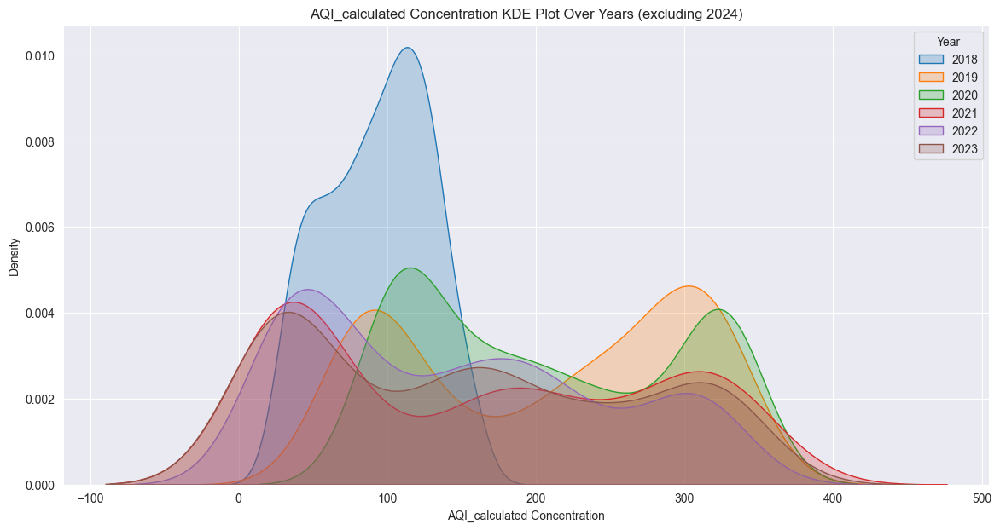

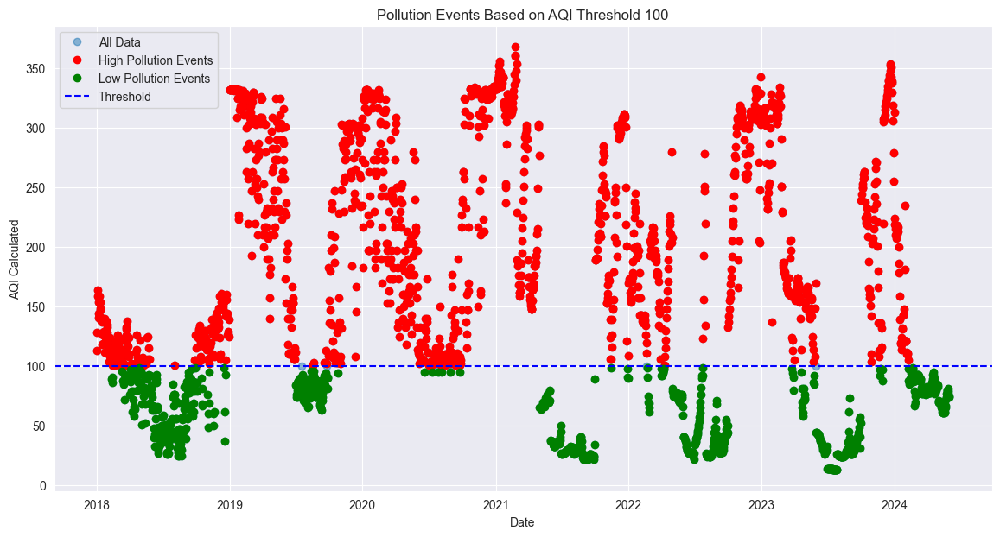

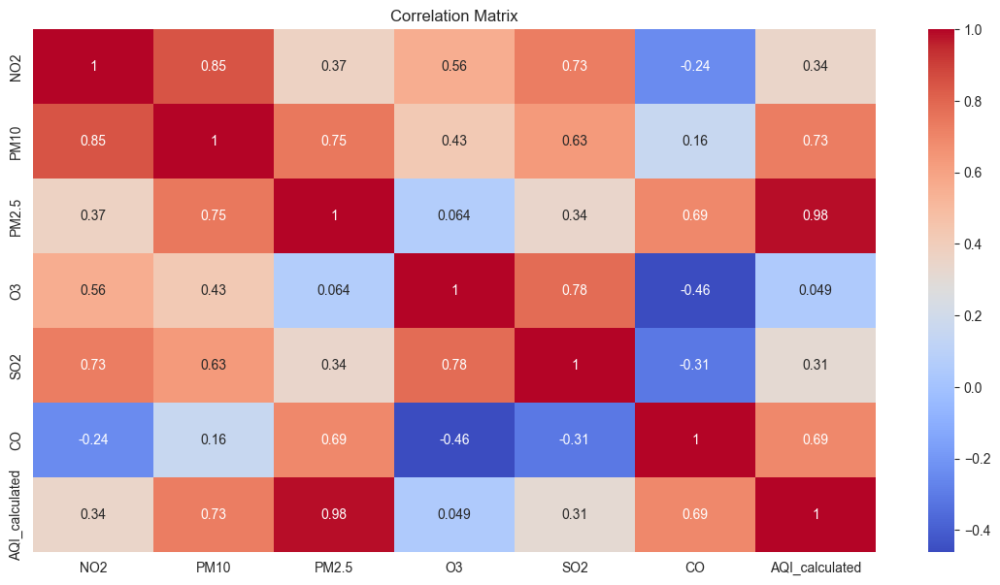

In [82]:
city_analyzer = AirQualityAnalyzer(df_Hyderabad, 'Hyderabad')
pollutants = ['PM10', 'PM2.5', 'AQI_calculated']
years = [2018,2019,2020,2021, 2022, 2023, 2024]
threshold = 100  
city_analyzer.analyze(pollutants, years, threshold)

## 6.7 Bhopal

In [83]:
df_Bhopal= new_df[new_df['city']=='Bhopal']

In [84]:
df_Bhopal[['NO2', 'PM10', 'PM2.5', 'O3', 'SO2', 'CO','AQI_calculated']].describe()

,NO2,PM10,PM2.5,O3,SO2,CO,AQI_calculated
count,2066.000000,2066.000000,2066.000000,2066.000000,2066.000000,2066.000000,2066.000000
mean,11.552457,70.831721,70.175204,43.566894,7.812366,3.211344,152.462246
std,6.864443,36.550143,43.235792,27.033050,2.698616,4.363455,94.264775
min,0.800000,6.944000,5.587000,1.000000,2.359000,0.254000,19.000000
25%,6.500000,43.000000,36.344250,18.625000,5.700000,0.559000,83.000000
50%,10.448000,72.458500,64.575500,40.192000,7.823500,0.817000,130.000000
75%,14.800750,92.000000,93.000000,64.465250,9.442500,4.700000,210.750000
max,50.134999,278.000000,420.000000,111.730000,28.035001,26.799999,531.000000


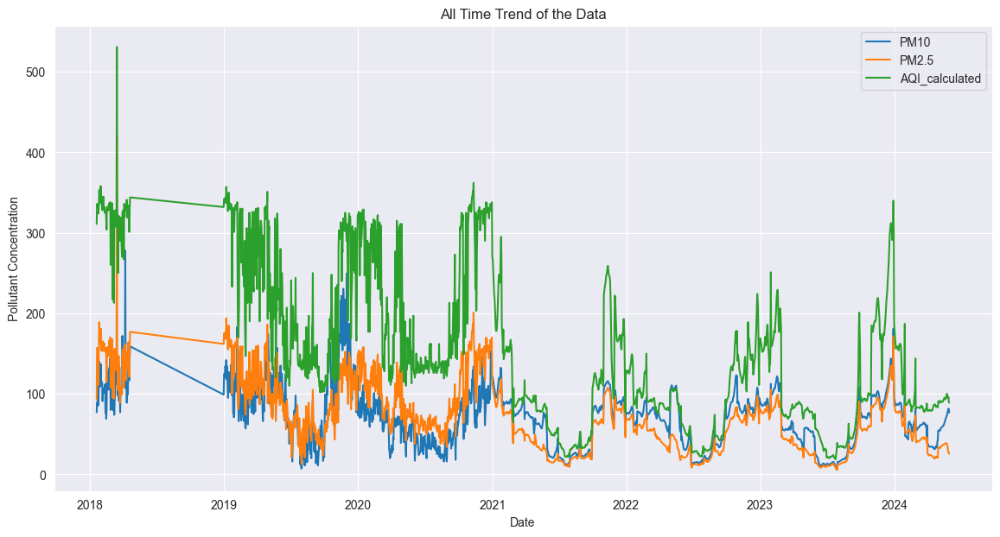

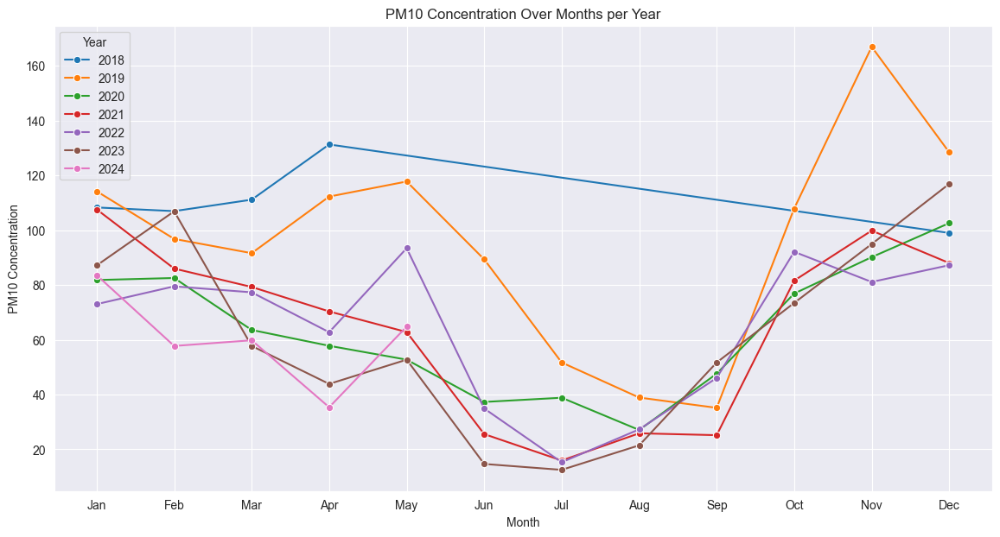

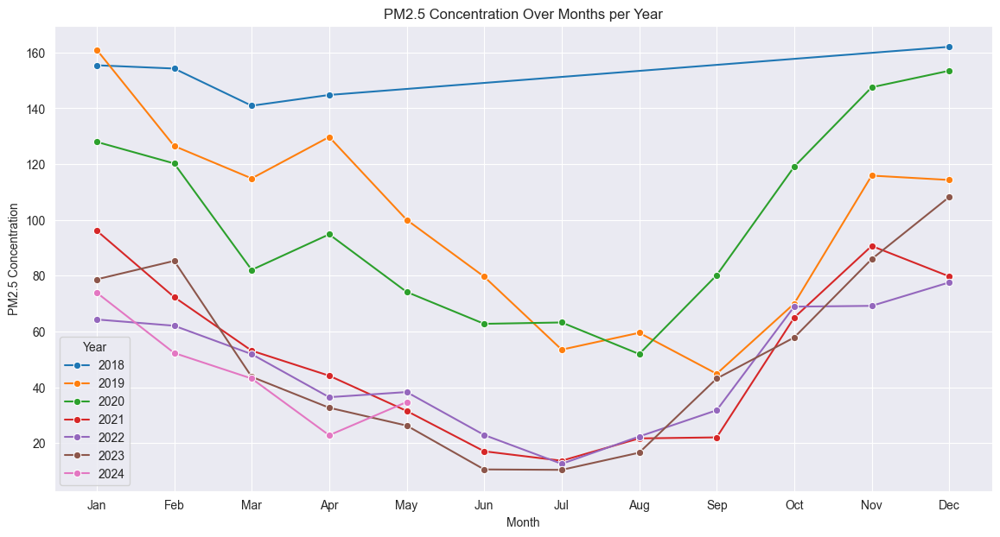

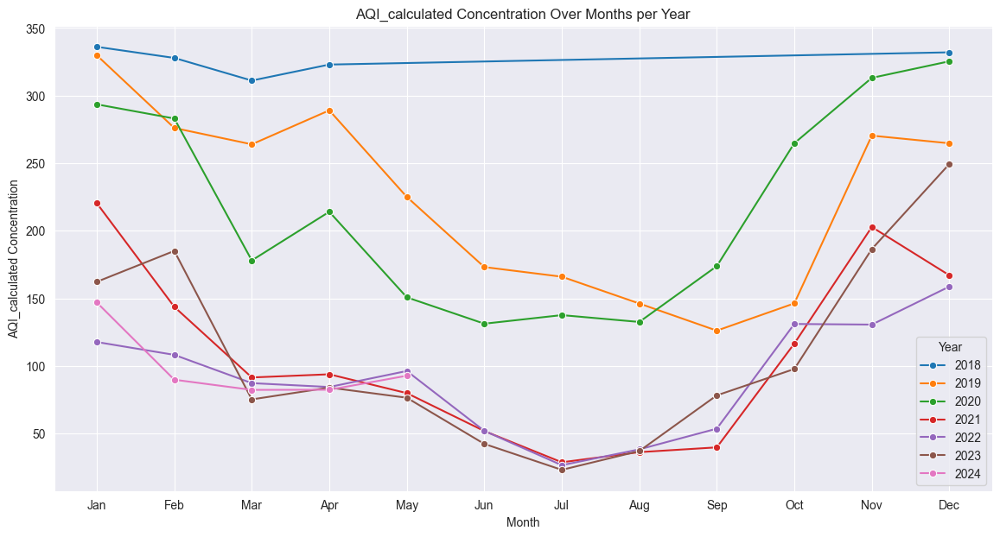

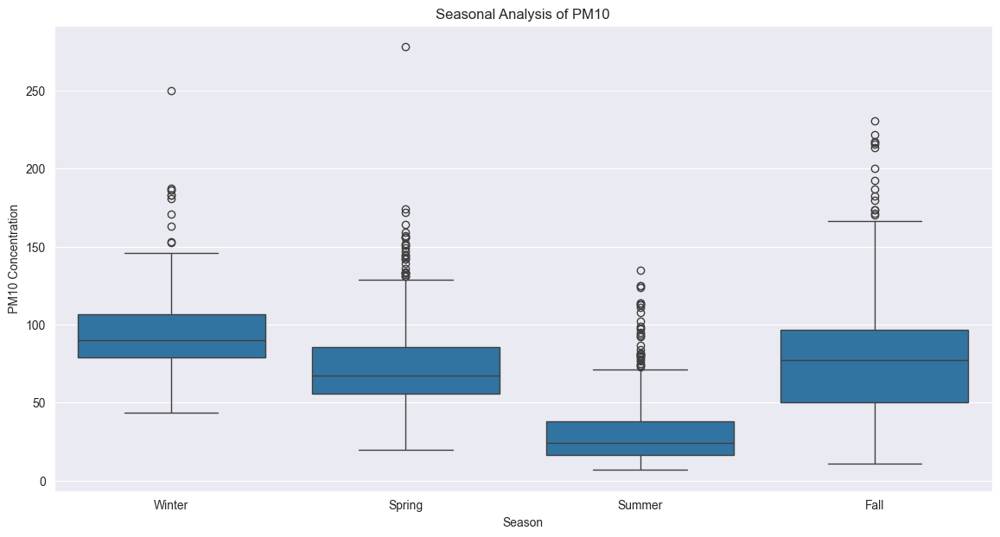

...

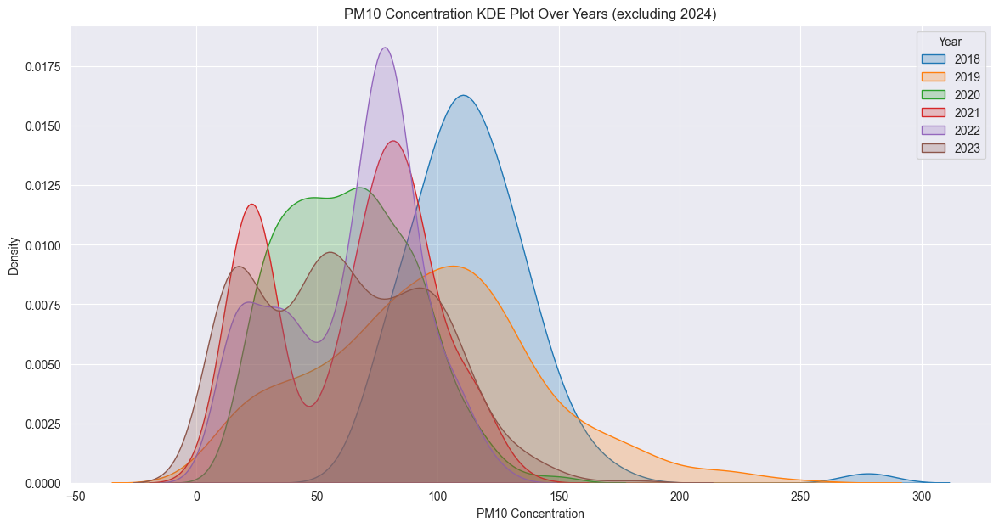

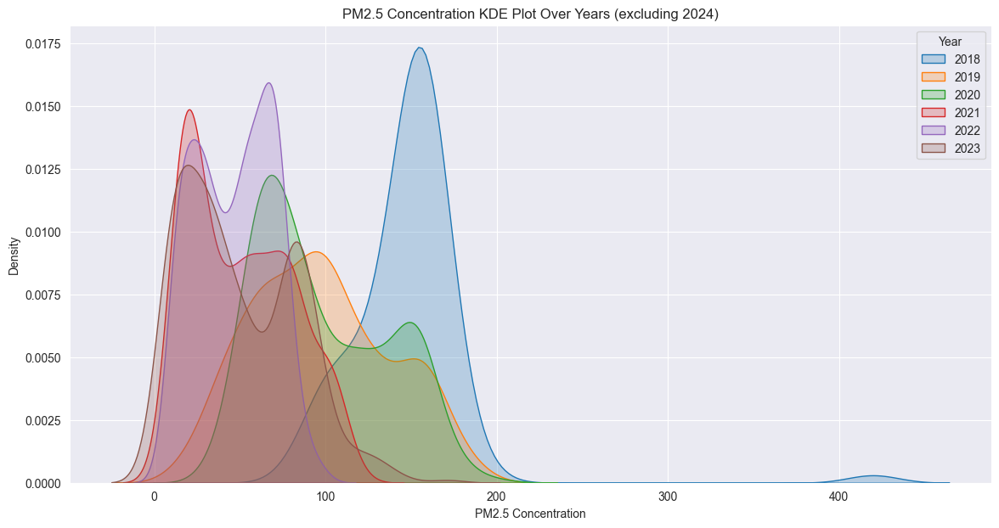

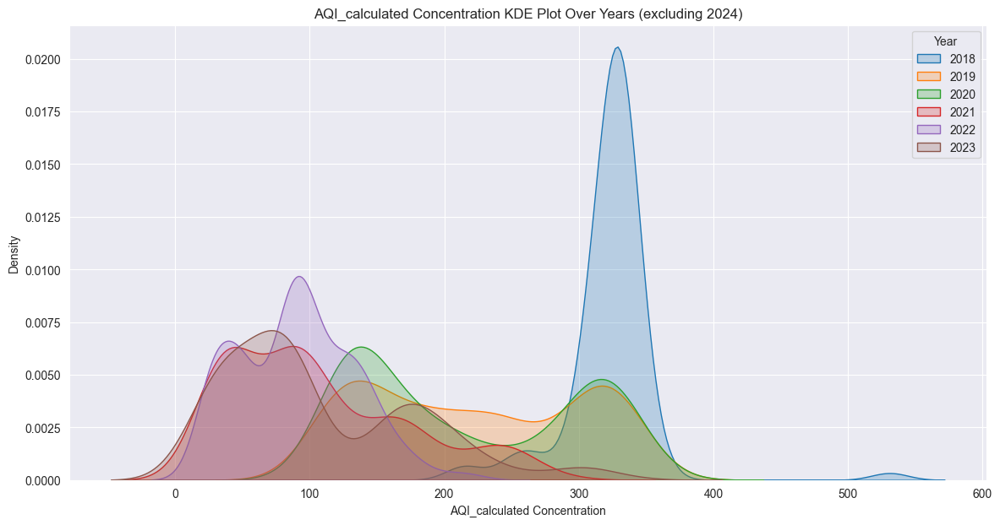

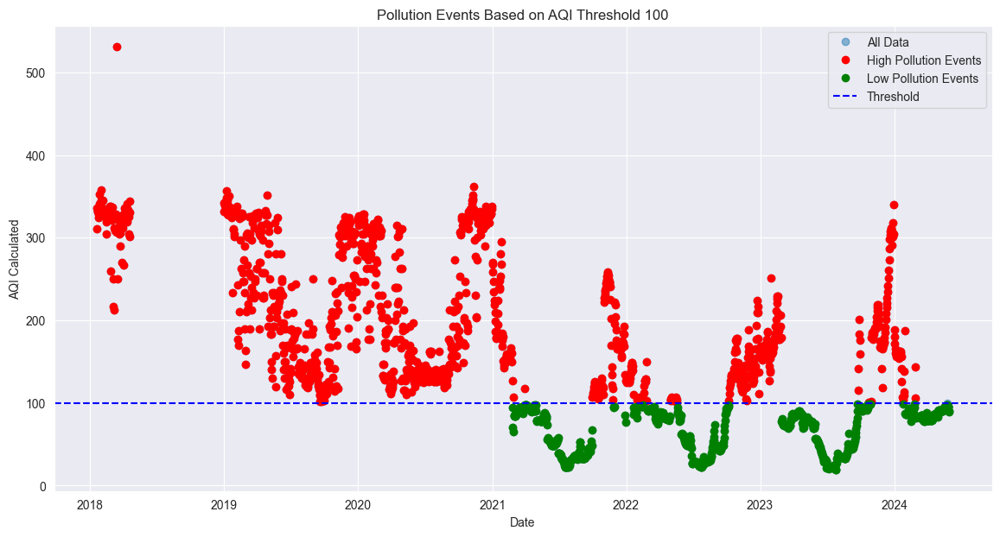

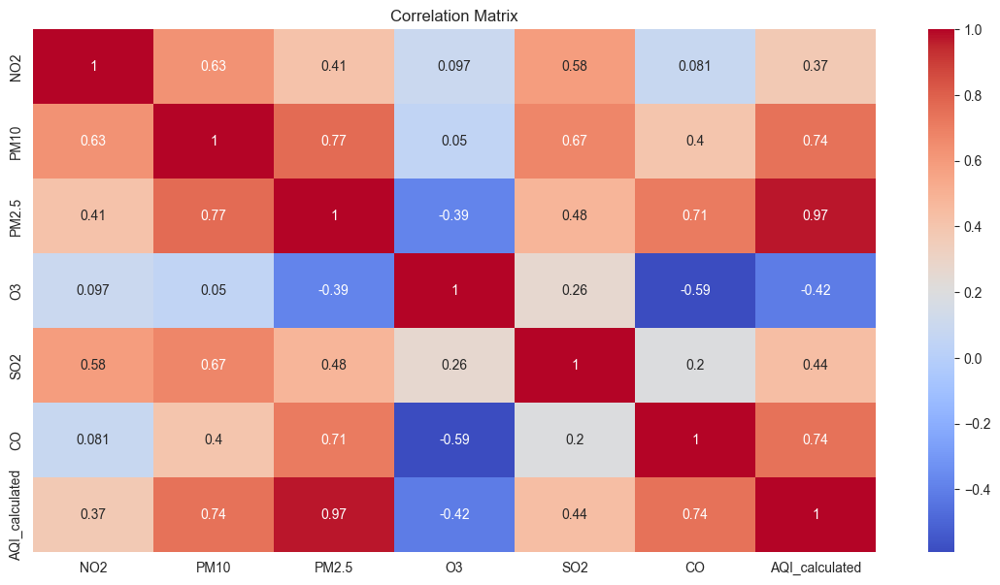

In [85]:
city_analyzer = AirQualityAnalyzer(df_Bhopal, 'Bhopal')
pollutants = ['PM10', 'PM2.5', 'AQI_calculated']
years = [2018,2019,2020,2021, 2022, 2023, 2024]
threshold = 100  
city_analyzer.analyze(pollutants, years, threshold)

## 6.8 Chennai

In [86]:
df_Chennai = new_df[new_df['city']=='Chennai']

In [87]:
df_Chennai[['NO2', 'PM10', 'PM2.5', 'O3', 'SO2', 'CO','AQI_calculated']].describe()

,NO2,PM10,PM2.5,O3,SO2,CO,AQI_calculated
count,2340.000000,1830.000000,2340.000000,2340.000000,2340.000000,2340.000000,2340.000000
mean,18.281680,53.197803,65.365257,32.658558,16.658678,3.016755,142.600427
std,11.338712,37.802096,34.203393,22.381169,13.006233,3.045209,81.776705
min,0.600000,0.000000,7.536000,1.000000,1.000000,0.385000,23.000000
25%,7.600000,28.132001,38.401000,12.973000,3.500000,0.711750,70.000000
50%,17.387999,45.205500,61.000000,31.122000,17.130500,1.068500,130.000000
75%,26.745000,75.882500,86.043750,47.285500,27.631000,5.500000,190.000000
max,58.506000,241.600006,184.352000,118.137000,76.165000,12.400000,350.000000


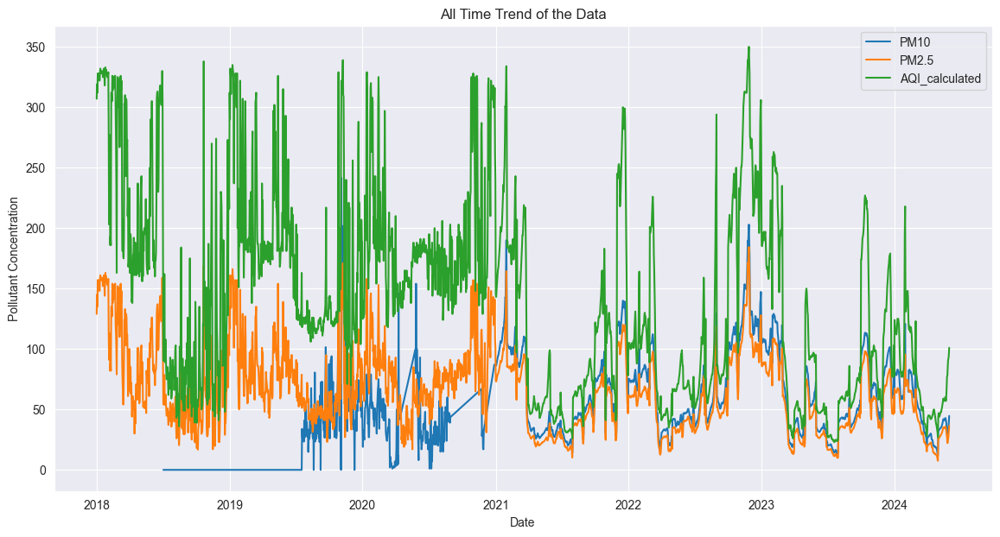

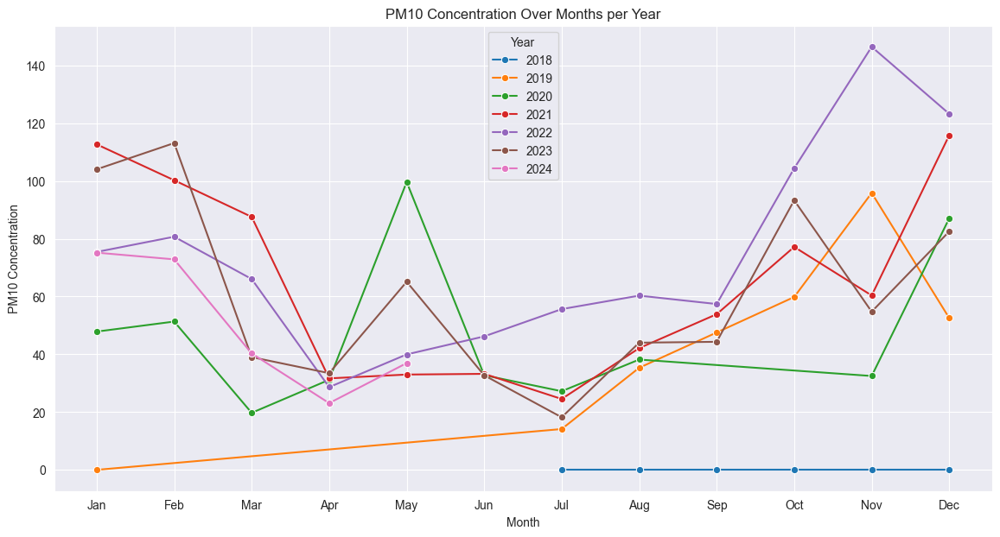

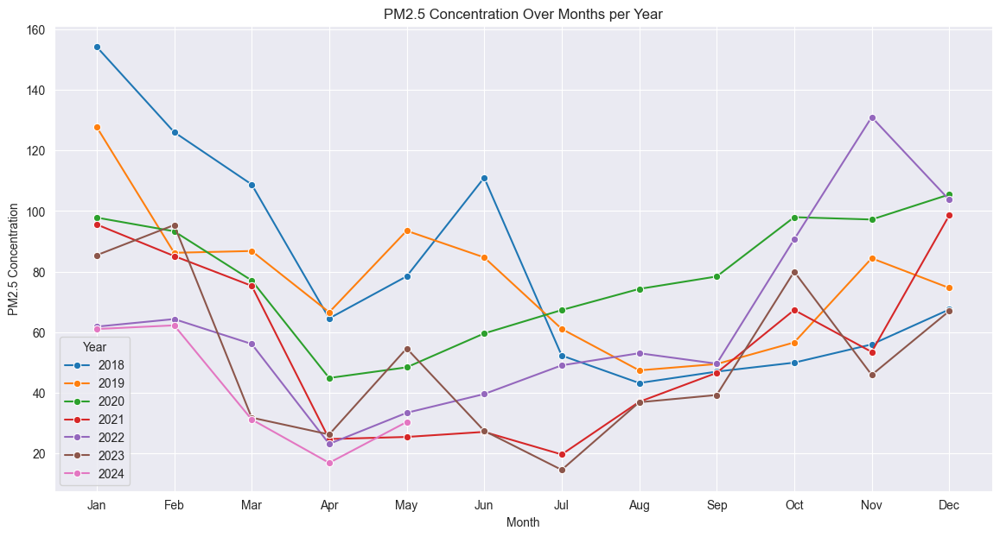

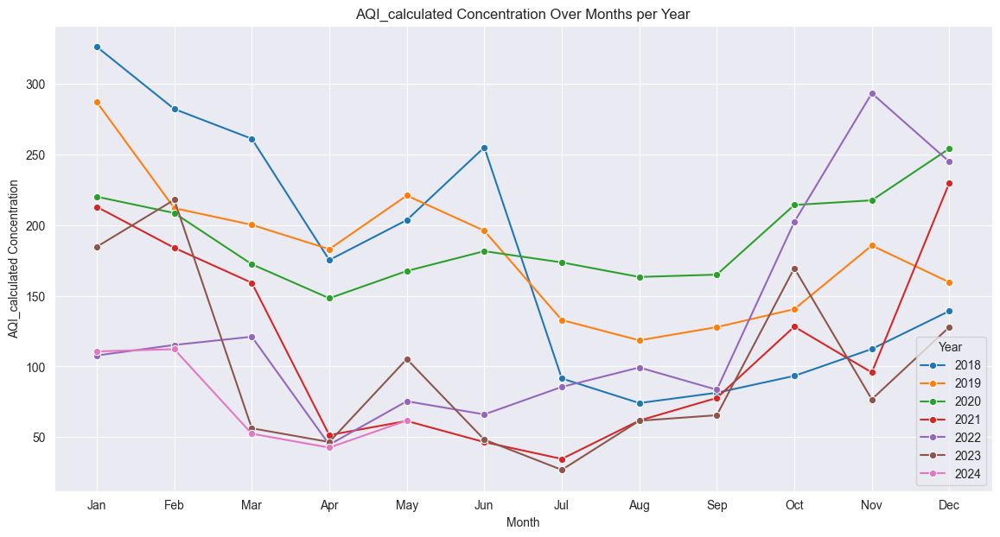

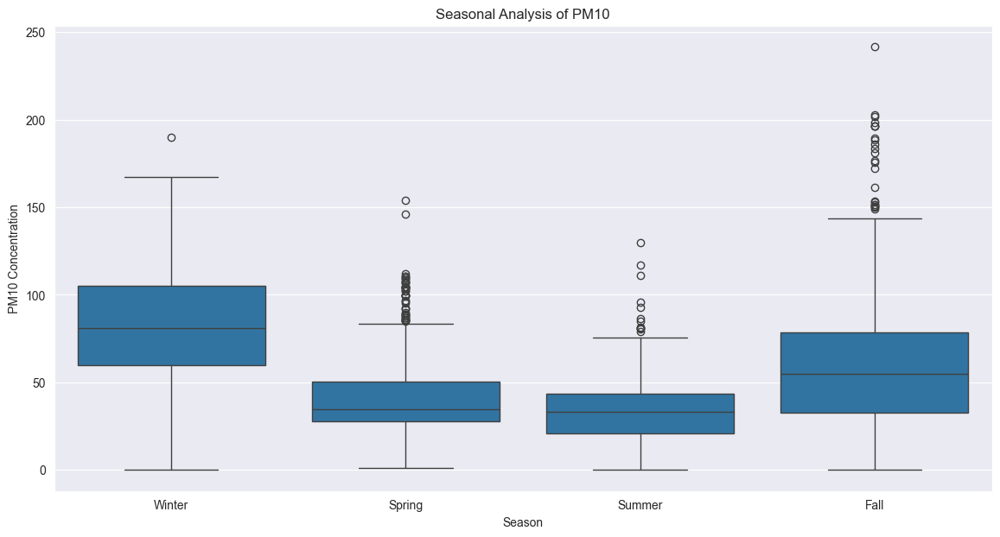

...

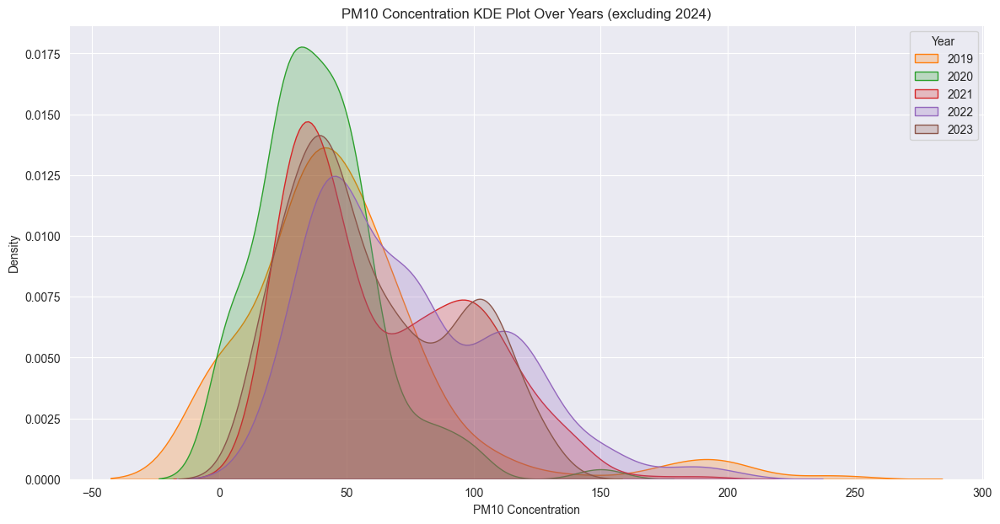

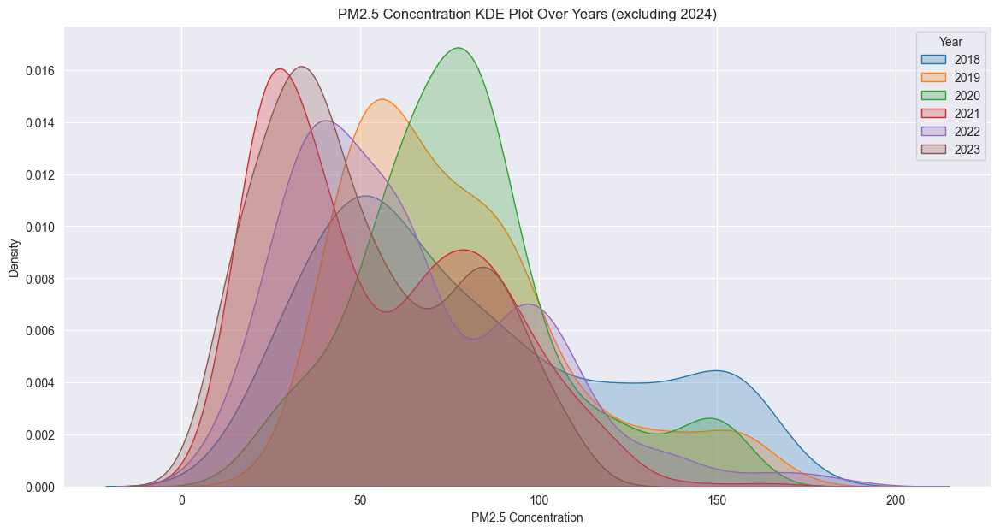

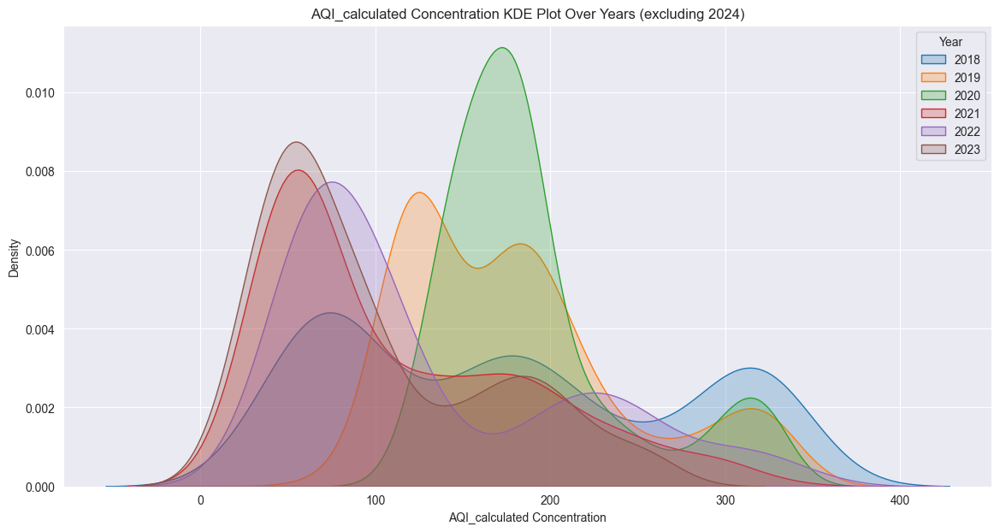

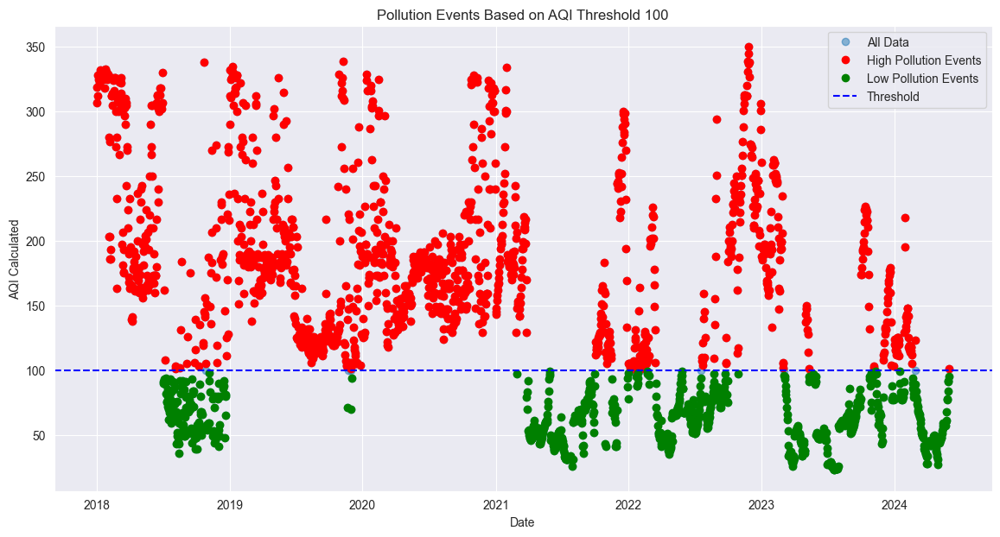

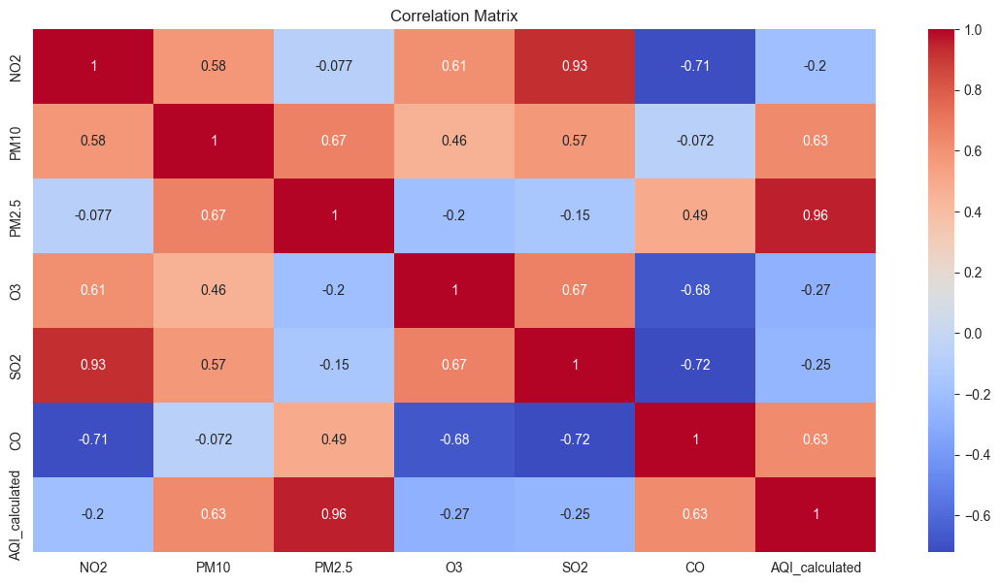

In [88]:
city_analyzer = AirQualityAnalyzer(df_Chennai, 'Chennai')
pollutants = ['PM10', 'PM2.5', 'AQI_calculated']
years = [2018,2019,2020,2021, 2022, 2023, 2024]
threshold = 100  
city_analyzer.analyze(pollutants, years, threshold)

## 6.9 Bengaluru

In [89]:
df_Bengaluru = new_df[new_df['city']=='Bengaluru']

In [90]:
df_Bengaluru[['NO2', 'PM10', 'PM2.5', 'O3', 'SO2', 'CO','AQI_calculated']].describe()

,NO2,PM10,PM2.5,O3,SO2,CO,AQI_calculated
count,2340.000000,2270.000000,2340.000000,2277.000000,2340.000000,2340.000000,2340.000000
mean,16.158811,43.119712,48.608490,34.209384,5.961804,2.834339,112.033333
std,7.907877,25.565156,36.884443,24.904130,3.157668,3.014235,83.254739
min,3.000000,2.614000,1.899000,1.000000,1.300000,0.256000,13.000000
25%,10.700000,25.544625,20.934999,15.700000,3.542500,0.546000,50.000000
50%,15.021000,43.601500,40.252500,23.234000,4.967000,0.843500,82.000000
75%,20.355500,59.249251,68.789999,52.691000,8.271000,5.600000,151.000000
max,63.570000,181.410004,164.000000,105.148000,17.333000,13.300000,334.000000


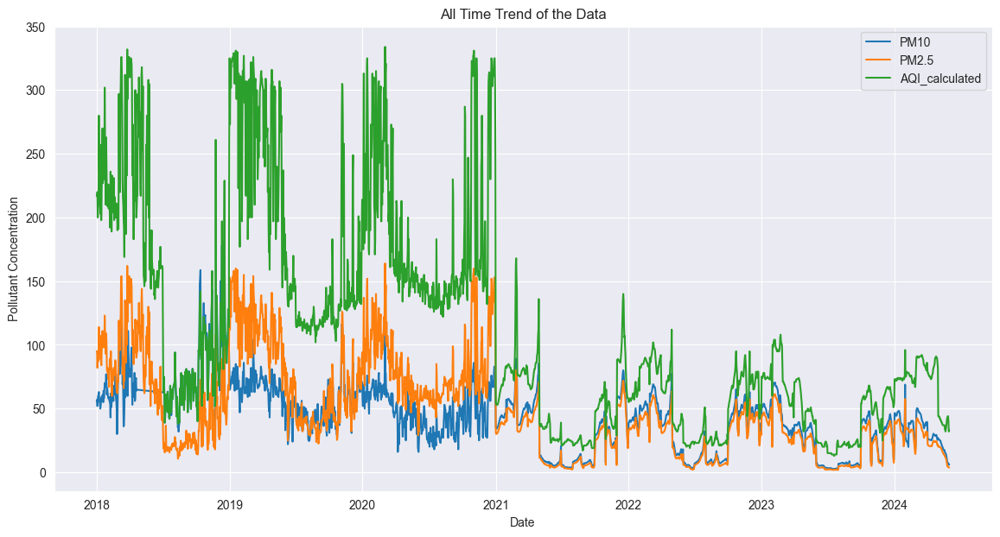

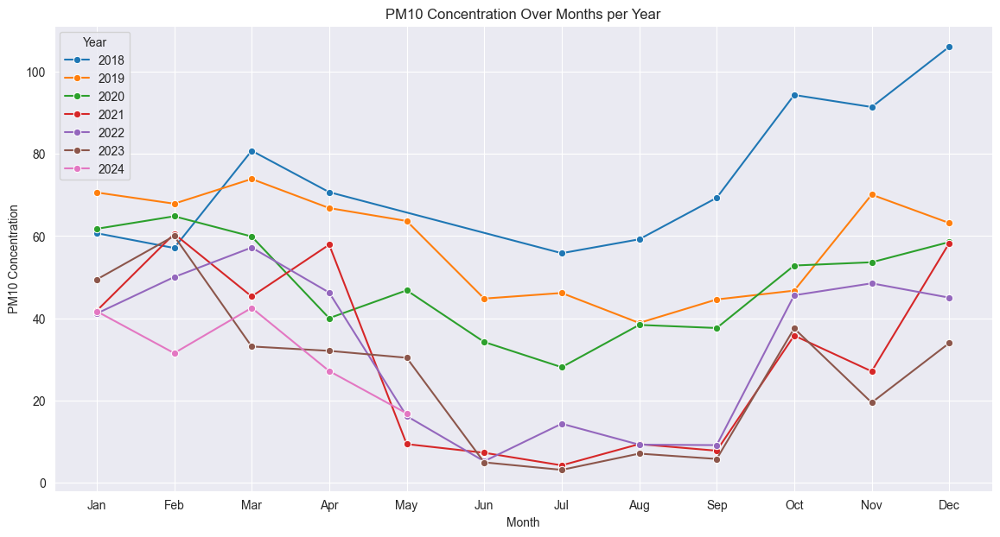

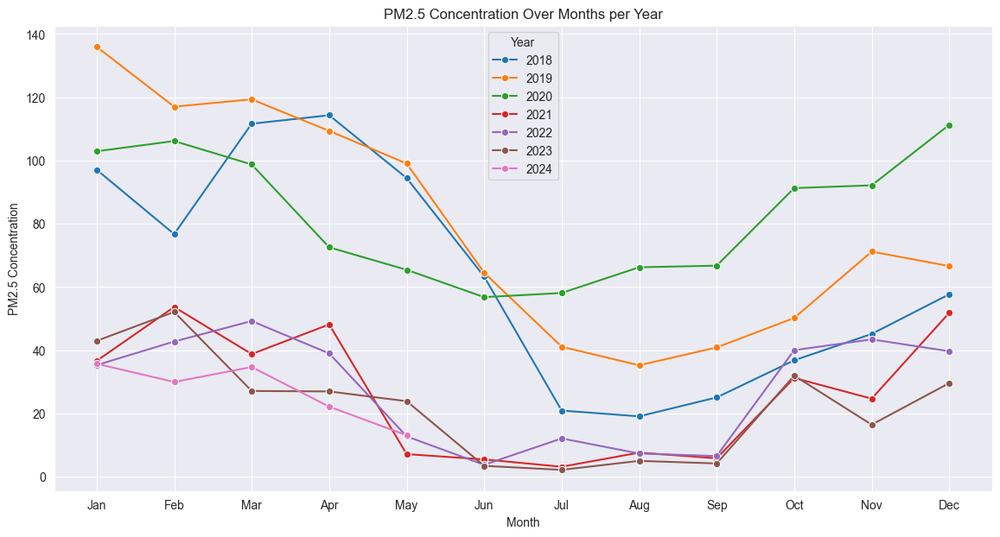

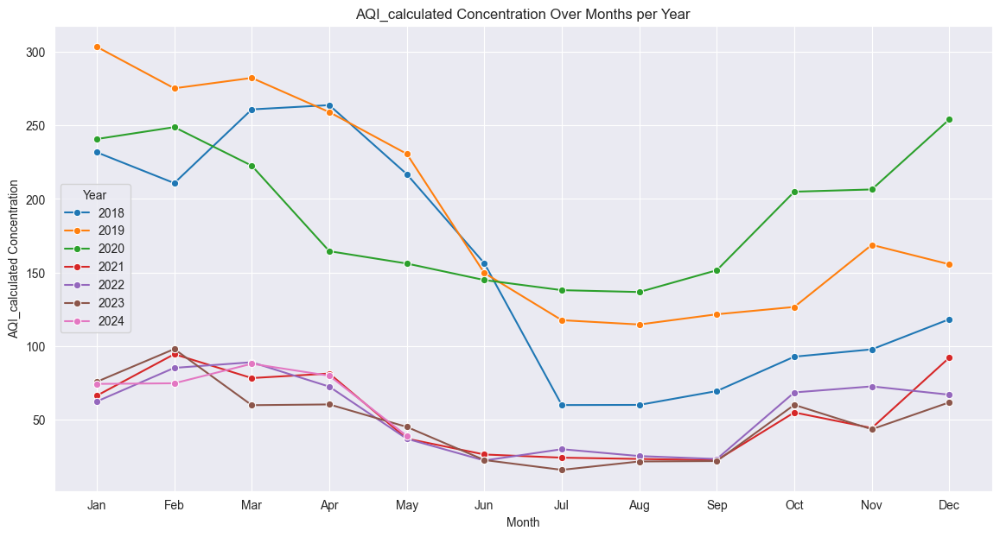

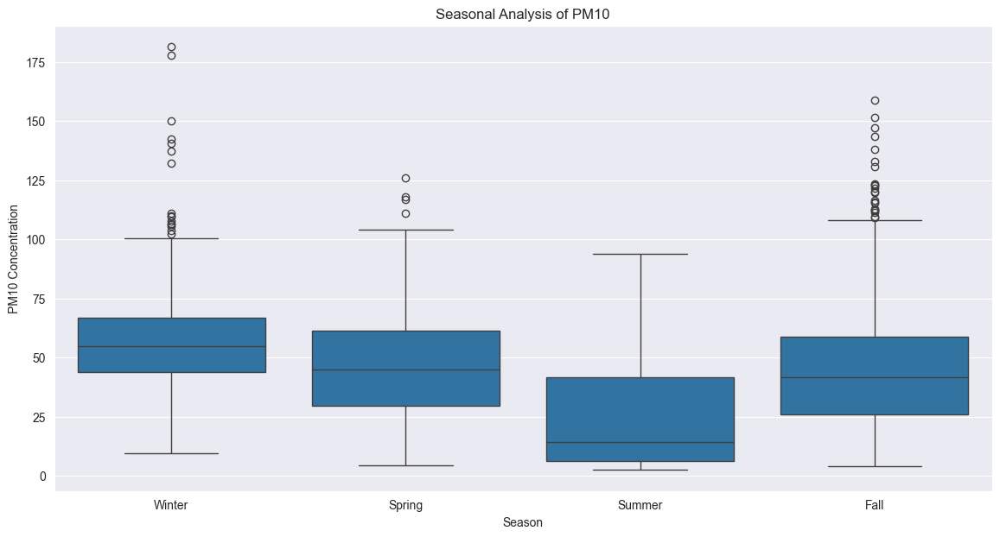

...

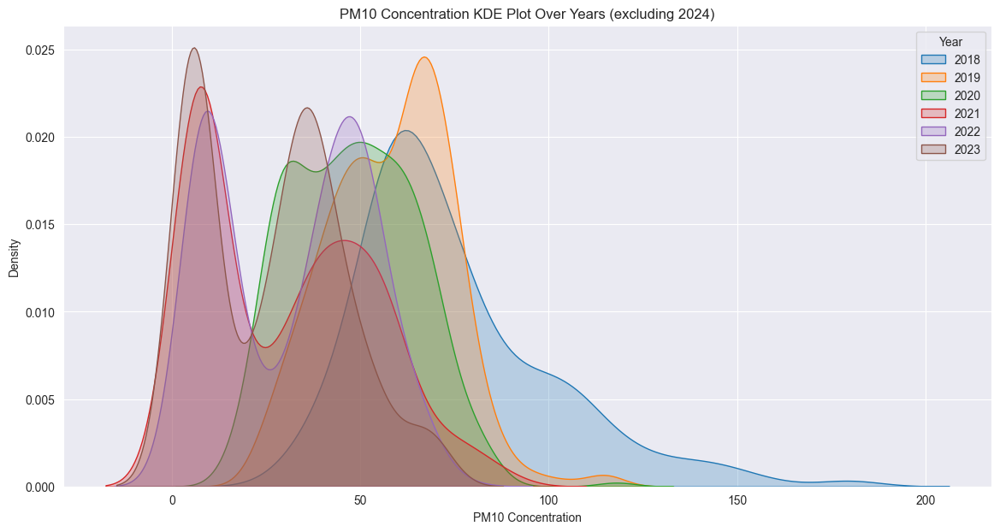

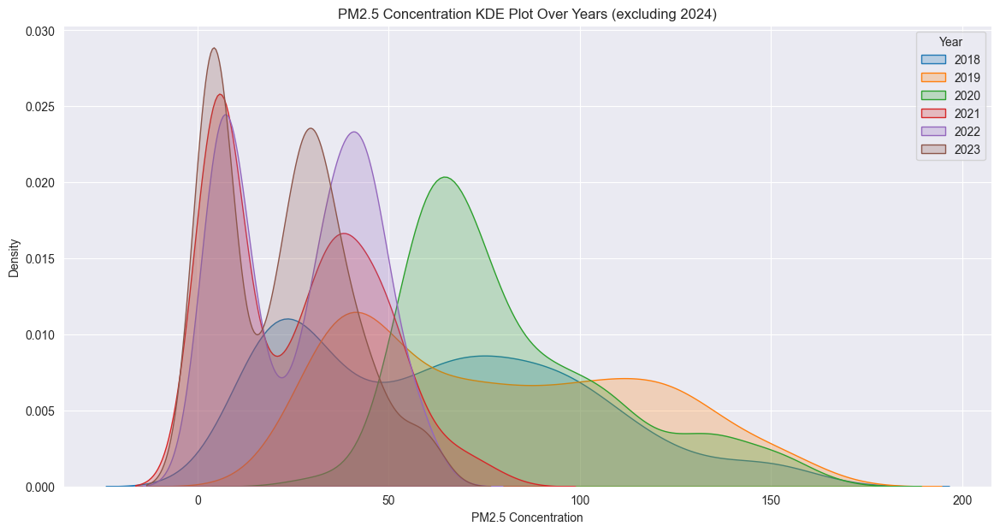

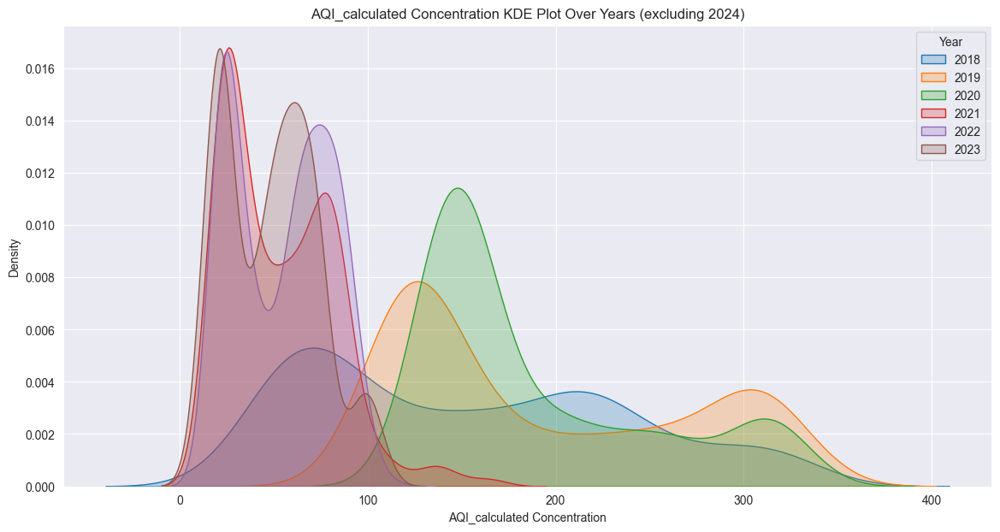

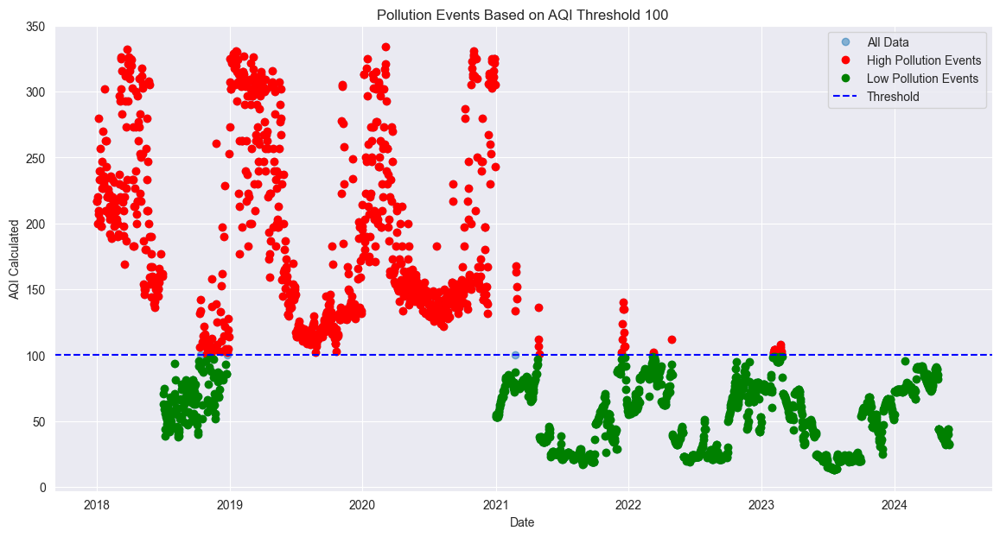

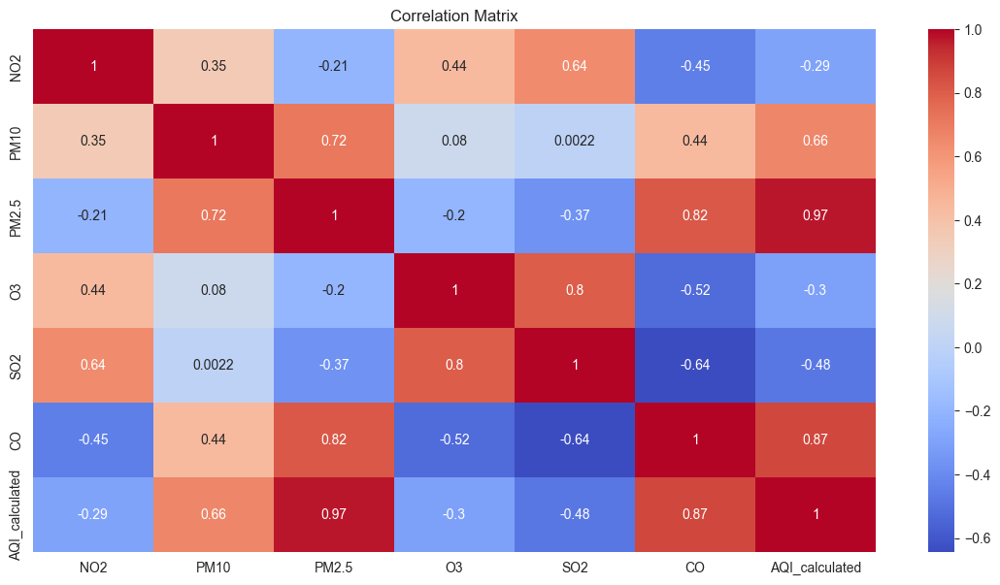

In [91]:
city_analyzer = AirQualityAnalyzer(df_Bengaluru, 'Bengaluru')
pollutants = ['PM10', 'PM2.5', 'AQI_calculated']
years = [2018,2019,2020,2021, 2022, 2023, 2024]
threshold = 100  
city_analyzer.analyze(pollutants, years, threshold)

## 6.10 Thiruvananthapuram

In [92]:
df_Thiruvananthapuram = new_df[new_df['city']=='Thiruvananthapuram']

In [93]:
df_Thiruvananthapuram[['NO2', 'PM10', 'PM2.5', 'O3', 'SO2', 'CO','AQI_calculated']].describe()

,NO2,PM10,PM2.5,O3,SO2,CO,AQI_calculated
count,2336.000000,2336.000000,2336.000000,2336.000000,2336.000000,2336.000000,2336.000000
mean,8.576556,39.993604,46.455695,29.298977,4.868053,3.063268,106.963613
std,4.618378,20.239285,35.227310,16.656527,2.418438,3.909963,82.004314
min,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000
25%,5.062500,25.000000,19.082750,16.445750,3.300000,0.500000,43.000000
50%,7.963000,40.107000,38.016000,27.299999,5.202000,0.747000,77.000000
75%,11.974000,53.451501,63.000000,37.309000,6.164250,5.500000,151.250000
max,24.706000,124.330002,169.000000,93.281000,34.230000,65.699997,586.000000


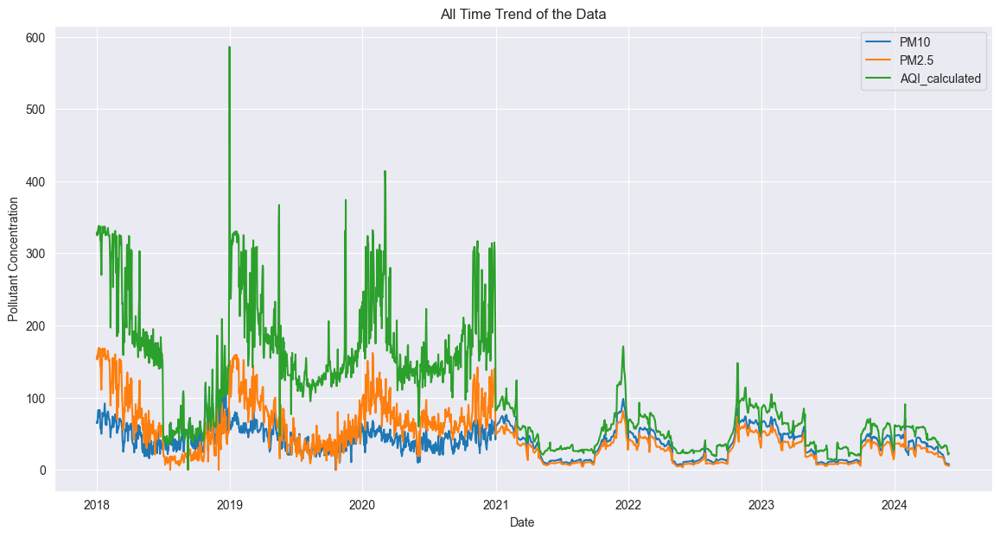

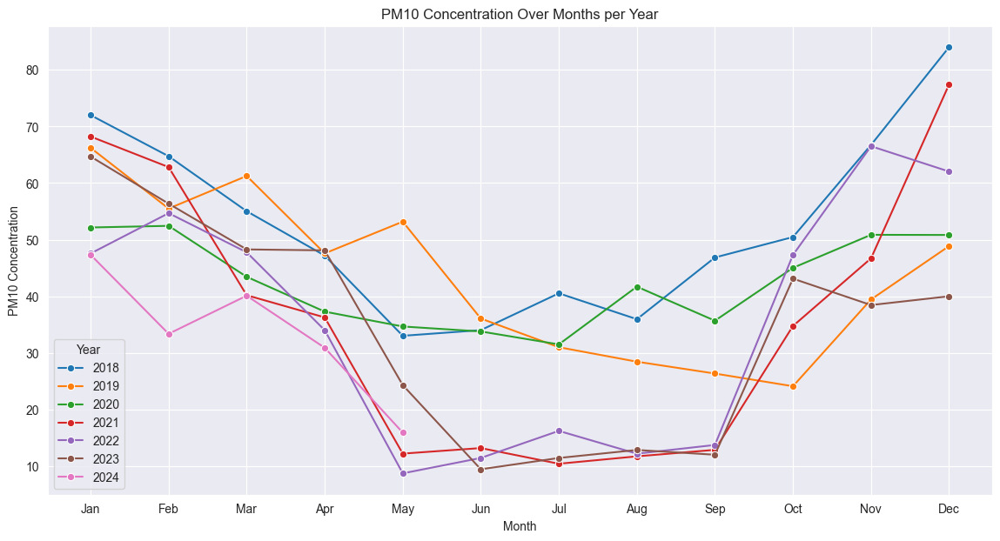

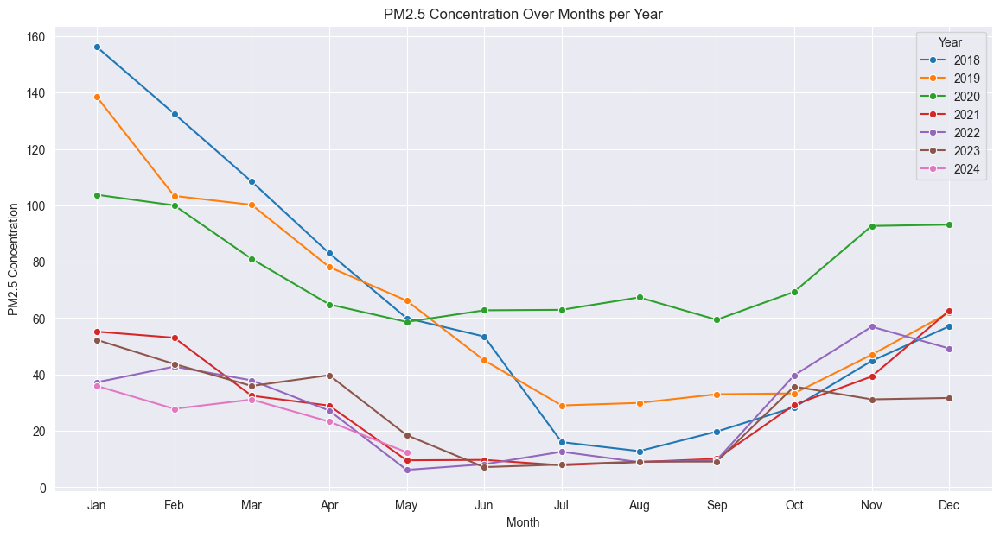

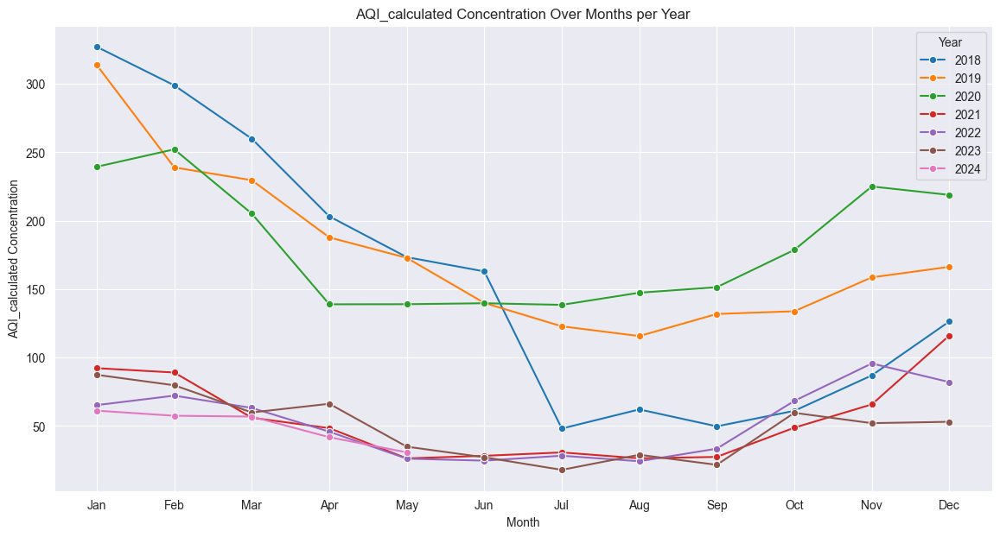

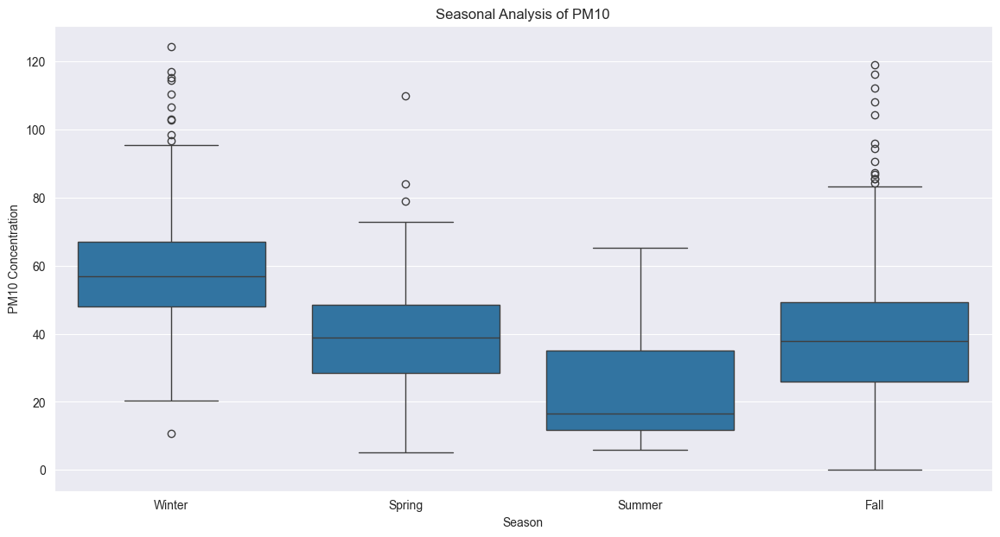

...

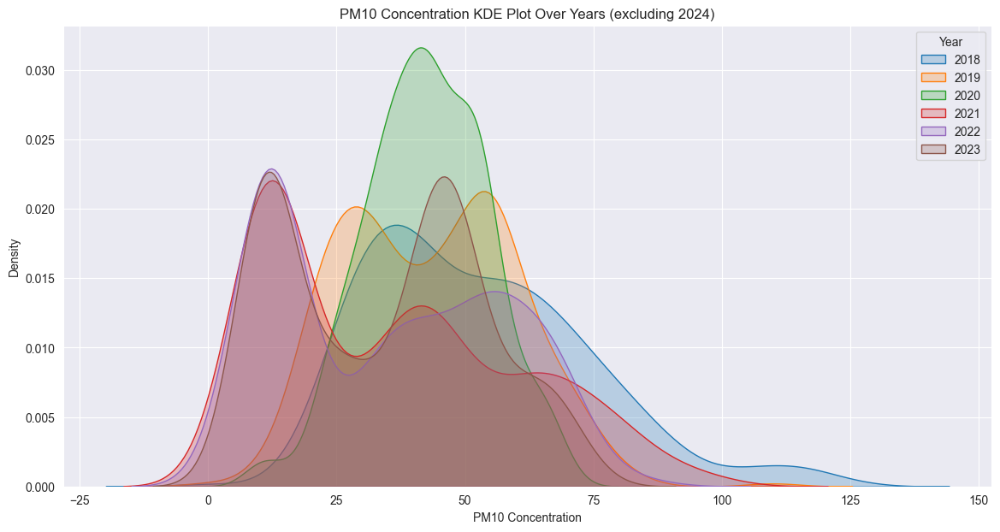

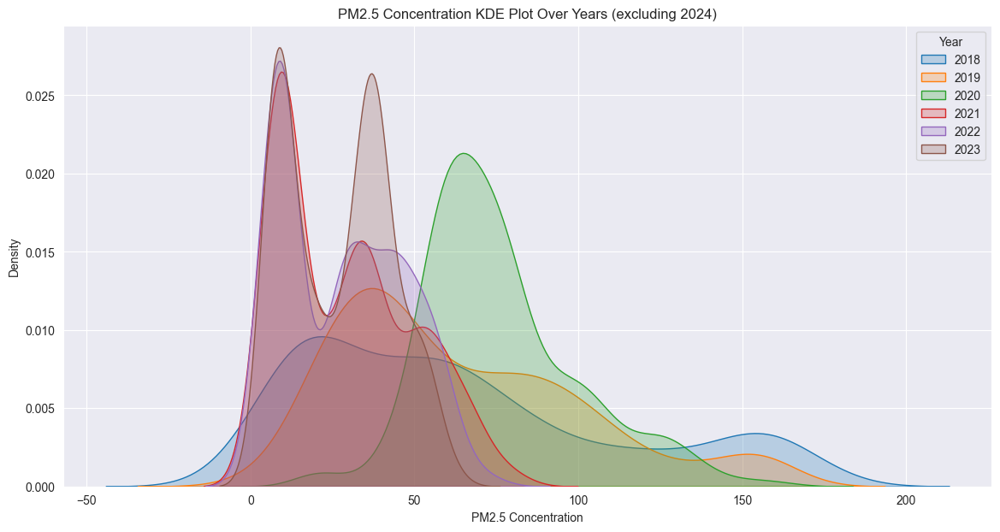

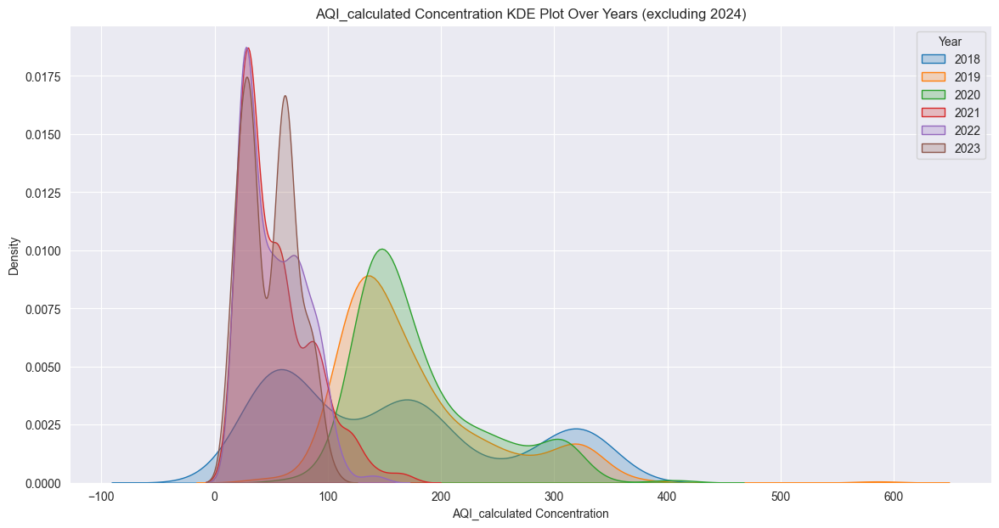

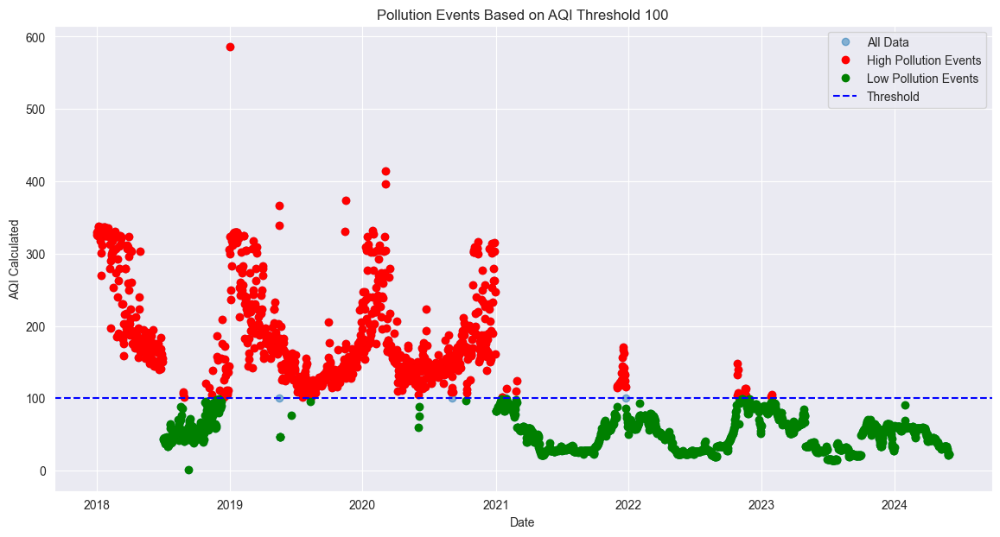

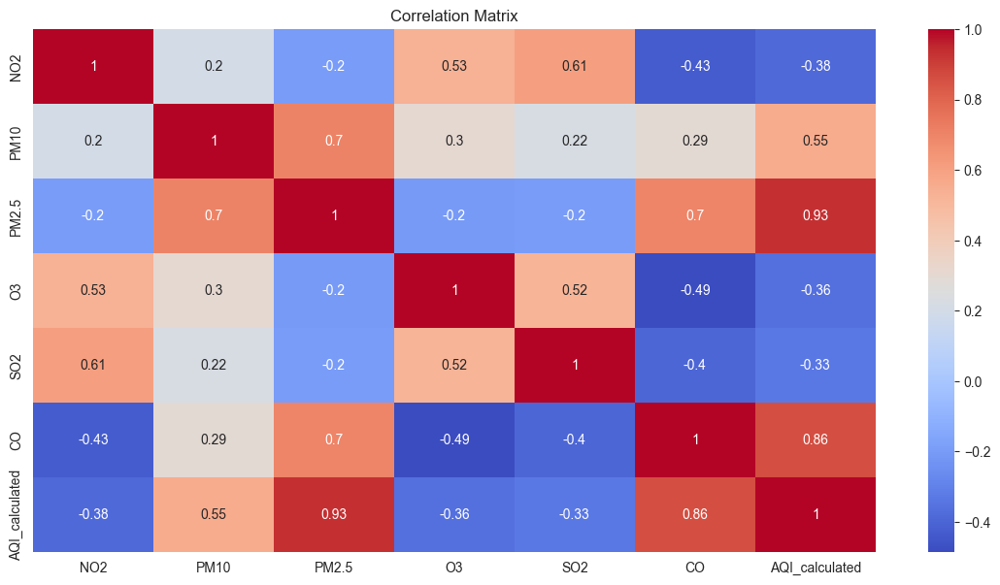

In [94]:
city_analyzer = AirQualityAnalyzer(df_Thiruvananthapuram, 'Thiruvananthapuram')
pollutants = ['PM10', 'PM2.5', 'AQI_calculated']
years = [2018,2019,2020,2021, 2022, 2023, 2024]
threshold = 100  
city_analyzer.analyze(pollutants, years, threshold)